# 2024-03-28 30v3 - Implementing gridsearch and analyzing its impact-- REBUTTALS.ipynb
Clone of `2024-01-30 30 - Implementing gridsearch and analyzing its impact.ipynb`. This is the main notebook for the generation of new plots and tables for the rebuttal requests. 

The plan is to include: 
- New models (iTransformer, Pyraformer, etc)
- New datasets (ETTh,ETTm, illness, traffic)
- Some cleanup specific to the new datasets and models.
- New plots and tables to satisfy reviewers requests
- Cleanups and refactors to common data processing and plot functions.

## Parameters

In [154]:
# Needed to filter on the gridsearch
CONSTRAINT_TYPE='constant'

Folder name

In [156]:
import datetime
import os 

today = datetime.date.today()
formatted_date = today.strftime("%Y-%m-%d")

# Figures will be stored here.
FIGURES_FOLDER = f"../figures/icml_{formatted_date}"


os.makedirs(FIGURES_FOLDER, exist_ok=True)
FIGURES_FOLDER

'../figures/icml_2024-03-28'

## Libraries and setup

In [157]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [158]:
import sys
import os
sys.path.append(os.path.abspath(os.path.join(os.getcwd(), os.pardir)))

In [159]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import matplotlib as mpl
import seaborn as sns
from IPython.display import display, Markdown, Latex

In [160]:
from utils import wandb_utils

## Data loading
From the cached pkl files. If they break, use the CSV ones.

### Resilience data
The original resilience runs from the paper are in this dataset. Rebuttal runs did not have resilience as of march 28 morning.
### Non resilience data
Original experiment data including non-resilience constant-$\epsilon$ runs

In [175]:
#CONSTRAINT_TYPE='constant' #TODO see if we will need this.

# Resilience runs will be merged later to the df.
real_df_resilience = pd.read_pickle("../data_backups/2024_02_01_1038am__icml_backup_data.pkl")
real_df_resilience = real_df_resilience.query('constraint_type=="constant_resilience" or constraint_type=="erm"')

# Real data is the original set of runs
real_df = pd.read_pickle("../data_backups/2024_02_01_1038am__icml_backup_data.pkl")
real_df = real_df.query('constraint_type=="constant" or constraint_type=="erm"')

# These two are the rebuttal runs
real_df_newdatasets = pd.read_pickle("../data_backups/2024_03_28__newdatasets_erm_and_constrained.pkl")
# Filter unused models or wrongly tagged
real_df_newmodels = pd.read_pickle("../data_backups/2024_03_28__newmodels_erm_and_constrained.pkl") \
        .query('model!="TimesNet"') \ 
        .query('model!="Transformer"') \
        .query('model!="Reformer"') \
        .query('model!="Autoformer"') \
        .copy()

# Add all except resilience for now
df = pd.concat([real_df,real_df_newmodels,real_df_newdatasets], ignore_index=True,axis=0)

display(real_df_resilience[['constraint_type','resilient_lr']].drop_duplicates())
display(df.head())

,constraint_type,resilient_lr
169344,constant_resilience,0.1
764640,erm,NaN


,des,gpu,itr,d_ff,data,freq,loss,seed,c_out,embed,...,hidden_dim,num_blocks,dynamic_dim,num_kernels,hidden_layers,p_hidden_dims,p_hidden_layers,linearity_overall,mae_overall,rmse_overall
0,Constrained loose weather.csv Autoformer 96 se...,0,1,2048,custom,h,mse,2021,21,timeF,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Constrained loose weather.csv Autoformer 96 se...,0,1,2048,custom,h,mse,2021,21,timeF,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Constrained loose weather.csv Autoformer 96 se...,0,1,2048,custom,h,mse,2021,21,timeF,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Constrained loose weather.csv Autoformer 96 se...,0,1,2048,custom,h,mse,2021,21,timeF,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Constrained loose weather.csv Autoformer 96 se...,0,1,2048,custom,h,mse,2021,21,timeF,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [177]:
real_df_newmodels.groupby(['model','constraint_type'])['run_id'].nunique().reset_index()

,model,constraint_type,run_id
0,FiLM,constant,24
1,FiLM,erm,16
2,Informer,constant,36
3,Nonstationary_Transformer,constant,57
4,Nonstationary_Transformer,erm,16
5,Pyraformer,constant,57
6,Pyraformer,erm,23
7,iTransformer,constant,34
8,iTransformer,erm,12


### Summary of runs per set of parameters.

In [179]:
display(real_df_newdatasets.constraint_type.unique())
real_df_newdatasets.groupby(['data_path','model','pred_len','seed','constraint_type'])['run_id'].nunique().reset_index().sort_values('run_id',ascending=True)

array(['constant', 'erm'], dtype=object)

,data_path,model,pred_len,seed,constraint_type,run_id
95,ETTm1.csv,Transformer,720,2021,erm,1
124,ETTm2.csv,Transformer,336,2021,constant,1
123,ETTm2.csv,Transformer,192,2021,erm,1
121,ETTm2.csv,Transformer,96,2021,erm,1
119,ETTm2.csv,Reformer,720,2021,erm,1
...,...,...,...,...,...,...
104,ETTm2.csv,Informer,96,2021,constant,3
102,ETTm2.csv,Autoformer,720,2021,constant,3
46,ETTh2.csv,Informer,720,2021,constant,3
98,ETTm2.csv,Autoformer,192,2021,constant,3


In [180]:
display(real_df_newmodels.constraint_type.unique())
real_df_newmodels.groupby(['data_path','model','pred_len','seed'])['run_id'].nunique().reset_index().sort_values('run_id',ascending=True)

array(['constant', 'erm'], dtype=object)

,data_path,model,pred_len,seed,run_id
65,exchange_rate.csv,Pyraformer,96,1711160126,1
83,traffic.csv,Nonstationary_Transformer,192,1711186078,1
81,traffic.csv,Nonstationary_Transformer,96,1711184315,1
79,traffic.csv,FiLM,720,1711458193,1
78,traffic.csv,FiLM,336,1711411084,1
...,...,...,...,...,...
119,weather.csv,Pyraformer,336,2021,6
117,weather.csv,Pyraformer,192,2021,6
20,electricity.csv,Nonstationary_Transformer,96,2021,6
24,electricity.csv,Nonstationary_Transformer,336,2021,6


In [181]:
df.groupby(['data_path','model','pred_len','seed'])['run_id'].nunique().reset_index().sort_values('run_id',ascending=True)

,data_path,model,pred_len,seed,run_id
262,weather.csv,iTransformer,720,1711477957,1
93,electricity.csv,Pyraformer,192,1711159977,1
92,electricity.csv,Pyraformer,192,1711157349,1
90,electricity.csv,Pyraformer,96,1711159468,1
89,electricity.csv,Pyraformer,96,1711151578,1
...,...,...,...,...,...
102,electricity.csv,Reformer,336,2021,7
103,electricity.csv,Reformer,720,2021,7
104,electricity.csv,Transformer,96,2021,7
77,electricity.csv,Informer,192,2021,7


In [182]:
# If there are not seven runs per set (6 constrained and one erm) means probably missing runs.
# As of march 28 there are some missing runs but we'll leave it like that for now.
runs_per_groupset=df.groupby(['data_path','model','pred_len','seed'])['run_id'].nunique().reset_index()
runs_per_groupset[runs_per_groupset.run_id!=7]

,data_path,model,pred_len,seed,run_id
0,ETTh1.csv,Autoformer,96,2021,4
1,ETTh1.csv,Autoformer,192,2021,4
2,ETTh1.csv,Autoformer,336,2021,4
3,ETTh1.csv,Autoformer,720,2021,4
4,ETTh1.csv,Informer,96,2021,4
...,...,...,...,...,...
258,weather.csv,iTransformer,192,1711477522,1
259,weather.csv,iTransformer,336,2021,3
260,weather.csv,iTransformer,336,1711477724,1
261,weather.csv,iTransformer,720,2021,3


## Data processing
This section contains processing specific to this experiment set. If you clone this notebook. Remove or refactor this section.

In [183]:
# TODO preprocessing here.

## Gridsearch function (todo extract into script)
Meant to be used on `df_constrained` (containing only constant constrained `df`)

In [184]:
def gridsearch(runs_df, objective_col, gridsearch_keys, reference_cols, split='val',mode='mean'):
    """
    Performs a gridsearch across the runs under `gridsearch_keys`, with the objective of minimizing `objective_col`.
    
    Parameters
    ---
    mode: is either 'mean' or 'std', to choose which statistic of the objective value to use for the gridsearch.
    
    Returns 
    ---
    
        the runs_df filtered by the best runs, and the summary metric of the best runs.
    """
    grouped_cols = gridsearch_keys + reference_cols + ['constraint_level'] #todo maybe don't need to hardcode this
    summary_metric = objective_col

    run_gridsearch_stats = runs_df.query(f"split=='{split}'").groupby(grouped_cols).agg(
        mean_objective=(objective_col, 'mean'),
        std_objective=(objective_col, 'std'),
        #mean_constraint_violation=('constraint_violation', 'mean'), #is it worth having other stuff here?
        count=('step', 'size')
    ).reset_index().sort_values(['model', 'std_objective'])

    best_runs = run_gridsearch_stats.groupby(gridsearch_keys)[f'{mode}_objective'].idxmin()
    best_runs_df = run_gridsearch_stats.loc[best_runs, :]
    filtered_runs_df = runs_df[runs_df['run_id'].isin(best_runs_df['run_id'].unique())] #TODO run_id is a hard requirement in the group cols.

    return filtered_runs_df, best_runs_df[grouped_cols + [f'{mode}_objective']]

### Label constraint_levels (`constraint_idx` column)
useful for joining when the constraint values are different for each model.

In [185]:
# There are three constraint levels per run, add a rank column, sorted by constraint level.
df=df.copy()#df_constrained.copy()
#display(df[['seed','data_path','model','pred_len','constraint_level']].drop_duplicates().sort_values(['data_path','model','pred_len','constraint_level']).head())
df.loc[df.constraint_type==CONSTRAINT_TYPE,'constraint_idx'] = df.query('constraint_type==@CONSTRAINT_TYPE').groupby(['seed','data_path','model','pred_len'])['constraint_level'].rank(method='dense', ascending=True).astype(int)
df.loc[df.constraint_type=='erm','constraint_idx'] = 0
df['constraint_idx'] = df['constraint_idx'].astype(int)
ranked_constraint_levels_summary = df[['run_id','data_path','model','pred_len','constraint_type','constraint_level','constraint_idx']].drop_duplicates('run_id').sort_values(['data_path','model','pred_len','constraint_level'])
print("Sanity checking on the summary")
ranked_constraint_levels_summary

Sanity checking on the summary


,run_id,data_path,model,pred_len,constraint_type,constraint_level,constraint_idx
928080,qb0eqo94,ETTh1.csv,Autoformer,96,erm,-1.000,0
853488,ncvpdj0w,ETTh1.csv,Autoformer,96,constant,0.246,1
853200,g7biweq5,ETTh1.csv,Autoformer,96,constant,0.262,2
852912,b4n0754u,ETTh1.csv,Autoformer,96,constant,0.290,3
927504,b2vj4hww,ETTh1.csv,Autoformer,192,erm,-1.000,0
...,...,...,...,...,...,...,...
422784,9hu9f3df,weather.csv,iTransformer,336,erm,NaN,0
401328,ahasa3n1,weather.csv,iTransformer,720,constant,0.578,1
399168,5uz71aw0,weather.csv,iTransformer,720,constant,0.653,2
394848,g5v8kf6o,weather.csv,iTransformer,720,constant,0.682,3


#### label constraints for resilience. 
The constraint idx column in resilience is used for reference in some of the table and plots

In [186]:
# There are three constraint levels per run, add a rank column, sorted by constraint level.
real_df_resilience=real_df_resilience.copy()#df_constrained.copy()
#display(df[['seed','data_path','model','pred_len','constraint_level']].drop_duplicates().sort_values(['data_path','model','pred_len','constraint_level']).head())
real_df_resilience.loc[real_df_resilience.constraint_type=='constant_resilience','constraint_idx'] = real_df_resilience.query('constraint_type=="constant_resilience"').groupby(['seed','data_path','model','pred_len'])['constraint_level'].rank(method='dense', ascending=True).astype(int)
real_df_resilience.loc[real_df_resilience.constraint_type=='erm','constraint_idx'] = 0
real_df_resilience['constraint_idx'] = real_df_resilience['constraint_idx'].astype(int)
ranked_constraint_levels_summary = real_df_resilience[['run_id','data_path','model','pred_len','constraint_type','constraint_level','constraint_idx']].drop_duplicates('run_id').sort_values(['data_path','model','pred_len','constraint_level'])
print("Sanity checking on the summary")
ranked_constraint_levels_summary

Sanity checking on the summary


,run_id,data_path,model,pred_len,constraint_type,constraint_level,constraint_idx
796608,uglzgsuo,electricity.csv,Autoformer,96,erm,-1.000,0
330624,rttdp6ef,electricity.csv,Autoformer,96,constant_resilience,0.111,1
447264,0d9sptym,electricity.csv,Autoformer,96,constant_resilience,0.115,2
330336,7b4xxa9i,electricity.csv,Autoformer,96,constant_resilience,0.118,3
304416,4yrvpcmy,electricity.csv,Autoformer,96,constant_resilience,0.151,4
...,...,...,...,...,...,...,...
448560,6a1s6u6q,weather.csv,Transformer,720,constant_resilience,0.215,2
335664,dp14p951,weather.csv,Transformer,720,constant_resilience,0.216,3
311760,n2nhx9xv,weather.csv,Transformer,720,constant_resilience,0.787,4
453456,389tqjsn,weather.csv,Transformer,720,constant_resilience,0.972,5


### Broadcast ERM runs with constraint levels and add gridsearch (`df_to_plot`)
to compare ERM with constrained, we need every ERM run repeated to pair it with a constrained run.

In [187]:
#TODO this version of this is not suited for multiple constraint types in a single dataset (will aggregate across all types)
df_constrained_nogridsearch = df.query('constraint_type=="constant"').copy()
df_constrained,best_runs = gridsearch(df_constrained_nogridsearch,objective_col='mse', gridsearch_keys=['model', 'pred_len', 'data_path'],reference_cols=['run_id'],split='val')

###Now filter resilience runs to only gridsearched ones
resilience_runs=real_df_resilience[['data_path','model','pred_len','constraint_idx','run_id']].drop_duplicates(['data_path','model','pred_len','constraint_idx'])
gridsearched_runs=df_constrained[['data_path','model','pred_len','constraint_level','constraint_idx']].drop_duplicates()

# sometimes there are two resilience runs for one gridsearched run, so we need to drop duplicates
gridsearched_resilience_runs = gridsearched_runs.merge(resilience_runs,
                         on=['data_path','model','pred_len','constraint_idx'],how='inner') \
                             .drop_duplicates(['data_path','model','pred_len','constraint_idx'])[['run_id']].drop_duplicates()

real_df_resilience_gridsearched=real_df_resilience.merge(gridsearched_resilience_runs,on='run_id')
display(real_df_resilience_gridsearched.shape)

df_erm = df.query('constraint_type=="erm"').copy()
#(data_path,model,pred_len,constraint_level,constrained_unconstraled)
distinct_constraints = df_constrained[['data_path','model','pred_len','constraint_idx','constraint_level']].drop_duplicates()

# crossjoin the ERM mse to all constraint levels
df_erm_w_broadcasted_constraint_levels = df_erm.drop(columns=['constraint_idx','constraint_level']).merge(distinct_constraints,on=['data_path','model','pred_len'],how='left')
df_to_plot = pd.concat([
    df_constrained,
    df_erm_w_broadcasted_constraint_levels,
    real_df_resilience_gridsearched
    ],axis=0)

# keep a df_to_plot without gridsearch (_nogs)
distinct_constraints_nogs = df_constrained_nogridsearch[['data_path','model','pred_len','constraint_idx','constraint_level']].drop_duplicates()
df_erm_w_broadcasted_constraint_levels_nogs = df_erm.drop(columns=['constraint_idx','constraint_level']).merge(distinct_constraints_nogs,on=['data_path','model','pred_len'],how='left')
df_to_plot_nogs=pd.concat([
    df_constrained_nogridsearch,
    df_erm_w_broadcasted_constraint_levels_nogs
    ],axis=0)


# sanity check
#display(df_erm_w_broadcasted_constraint_levels.shape)
#print(f"Three constraints per experiment, broadcasted dataset size be equal to {df_erm.shape[0]*1}")
#display(df_to_plot.shape)
#print(f"Final dataset size should be equal to {df_constrained.shape[0]+df_erm.shape[0]*1}")

(48384, 109)

### Add constraint violation metric

In [188]:
# Adding the constraint violation column
df_to_plot["constraint_violation"] = (df_to_plot.mse-df_to_plot.constraint_level).clip(lower=0)
df_to_plot['is_infeasible'] = (df_to_plot.constraint_violation>0)*1

# sanity check
dd=df_to_plot[['run_id','model','type','constraint_type','step','mse','constraint_level','constraint_violation','is_infeasible']].sort_values('run_id')
print("For ERM")
display(dd.query('type=="ERM"').query('constraint_violation>0').head())
print("For Constrained")
display(dd.query('type=="Constrained"').query('constraint_violation>0').head())
print("For resilient")
display(dd.query('constraint_type=="constant_resilience"').query('constraint_violation>0').head())


For ERM


,run_id,model,type,constraint_type,step,mse,constraint_level,constraint_violation,is_infeasible
28222,092u33lj,Reformer,ERM,erm,94,0.214217,0.15,0.064217,1
28130,092u33lj,Reformer,ERM,erm,2,0.196300,0.15,0.046300,1
28129,092u33lj,Reformer,ERM,erm,1,0.197517,0.15,0.047517,1
28128,092u33lj,Reformer,ERM,erm,0,0.205640,0.15,0.055640,1
28127,092u33lj,Reformer,ERM,erm,95,0.329340,0.15,0.179340,1


For Constrained


,run_id,model,type,constraint_type,step,mse,constraint_level,constraint_violation,is_infeasible
412415,0bmeup5p,iTransformer,Constrained,constant,47,0.459761,0.418,0.041761,1
412402,0bmeup5p,iTransformer,Constrained,constant,34,0.427217,0.418,0.009217,1
412403,0bmeup5p,iTransformer,Constrained,constant,35,0.430937,0.418,0.012937,1
412404,0bmeup5p,iTransformer,Constrained,constant,36,0.431003,0.418,0.013003,1
412405,0bmeup5p,iTransformer,Constrained,constant,37,0.436155,0.418,0.018155,1


For resilient


,run_id,model,type,constraint_type,step,mse,constraint_level,constraint_violation,is_infeasible
43917,1ue2lfo7,Autoformer,Constrained,constant_resilience,189,0.229736,0.207,0.022736,1
43916,1ue2lfo7,Autoformer,Constrained,constant_resilience,188,0.228758,0.207,0.021758,1
43924,1ue2lfo7,Autoformer,Constrained,constant_resilience,196,0.232013,0.207,0.025013,1
43915,1ue2lfo7,Autoformer,Constrained,constant_resilience,187,0.227608,0.207,0.020608,1
43918,1ue2lfo7,Autoformer,Constrained,constant_resilience,190,0.230254,0.207,0.023254,1


### Summary metrics per run
Summarize all three runs into metrics per split by averaging mse and constraint levels.

In [189]:
df_to_plot.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 441360 entries, 4608 to 48383
Columns: 126 entries, des to is_infeasible
dtypes: bool(6), float64(49), int64(37), object(34)
memory usage: 410.0+ MB


In [190]:
df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 928368 entries, 0 to 928367
Data columns (total 124 columns):
 #    Column                  Dtype  
---   ------                  -----  
 0    des                     object 
 1    gpu                     int64  
 2    itr                     int64  
 3    d_ff                    int64  
 4    data                    object 
 5    freq                    object 
 6    loss                    object 
 7    seed                    int64  
 8    c_out                   int64  
 9    embed                   object 
 10   lradj                   object 
 11   model                   object 
 12   revin                   int64  
 13   affine                  int64  
 14   dec_in                  int64  
 15   distil                  bool   
 16   enc_in                  int64  
 17   factor                  int64  
 18   stride                  int64  
 19   target                  object 
 20   d_model                 int64  
 21   devices 

In [191]:
df_to_plot['mae_overall']

4608    NaN
4609    NaN
4610    NaN
4611    NaN
4612    NaN
         ..
48379   NaN
48380   NaN
48381   NaN
48382   NaN
48383   NaN
Name: mae_overall, Length: 441360, dtype: float64

In [192]:
# Calculate mean and std for mse and constraint_violation. Rename them mean_{metric} and std_{metric

summary_metrics_per_run = df_to_plot.groupby([
    "data_path",
    "model",
    "pred_len",
    "run_id",
    "Algorithm", #Harmless carryover col for legacy purposes (verified the counts are the same)
    "constraint_type",
    'type',
    "constraint_idx",
    "split",
    "constraint_level",
    ]).aggregate(
        mse=('mse','mean'),
        mae=('mae_overall','mean'),
        rmse=('rmse_overall','mean'),
        linearity=('linearity_overall','mean'),
        window_std=('mse','std'),
        #std_mse=('mse','std'),
        mcv=('constraint_violation','mean'),
        #std_mcv=('constraint_violation','std'),
        mean_infeasible_rate=('infeasible_rate','mean'),
        #std_infeasible_rate=('infeasible_rate','std'),
        run_count=('run_id','nunique')
        ).reset_index().round(5)
summary_metrics = summary_metrics_per_run.groupby([
    "data_path",
    "model",
    "pred_len",
    'type', #ERM or constrained
    "constraint_type",
    "split",
    "Algorithm",
    "constraint_idx",
    "constraint_level",
    ]).aggregate(
        mse=('mse','mean'),
        mae=('mae','mean'),
        rmse=('rmse','mean'),
        linearity=('linearity','mean'),
        window_std=('window_std','mean'),
        std_mse=('mse','std'),
        mcv=('mcv','mean'),
        std_mcv=('mcv','std'),
        mean_infeasible_rate=('mean_infeasible_rate','mean'),
        std_infeasible_rate=('mean_infeasible_rate','std'),
        run_count=('run_count','mean')
    ).reset_index()
display(summary_metrics_per_run.shape)
display(summary_metrics.shape)
summary_metrics.head()

(1341, 18)

(1317, 20)

,data_path,model,pred_len,type,constraint_type,split,Algorithm,constraint_idx,constraint_level,mse,mae,rmse,linearity,window_std,std_mse,mcv,std_mcv,mean_infeasible_rate,std_infeasible_rate,run_count
0,ETTh1.csv,Autoformer,96,Constrained,constant,test,ETTh1 Autoformer,3.0,0.29,0.72397,0.62225,0.85019,-0.30551,0.04563,NaN,0.43397,NaN,1.00000,NaN,1.0
1,ETTh1.csv,Autoformer,96,Constrained,constant,train,ETTh1 Autoformer,3.0,0.29,0.26286,0.36519,0.25436,-0.50546,0.02183,NaN,0.00298,NaN,0.30208,NaN,1.0
2,ETTh1.csv,Autoformer,96,Constrained,constant,val,ETTh1 Autoformer,3.0,0.29,0.44102,0.46761,0.66304,0.85057,0.04031,NaN,0.15115,NaN,0.94179,NaN,1.0
3,ETTh1.csv,Autoformer,96,ERM,erm,test,AllModels_ETTh1.csv Autoformer,3.0,0.29,0.67871,0.60687,0.82333,0.19729,0.02408,NaN,0.38871,NaN,1.00000,NaN,1.0
4,ETTh1.csv,Autoformer,96,ERM,erm,train,AllModels_ETTh1.csv Autoformer,3.0,0.29,0.27643,0.36722,0.25443,-0.08874,0.04269,NaN,0.01162,NaN,1.00000,NaN,1.0


**END OF PREPROCESSING**

---
---

## Plots

### PAPER: ERM vs. Constrained on 50th percentile on all datasets (one seed)
nonresilience

In [201]:
#deleteme
df_to_plot#.query("model==''")
df_to_plot.model.unique()
df_to_plot.query("model=='Nonstationary_Transformer'").constraint_type.unique()
df_to_plot.query("model=='FiLM'").constraint_type.unique()
#real_df_newmodels.query("model=='Nonstationary_Transformer'").constraint_type.unique()
#real_df_newmodels.query("model=='Nonstationary_Transformer'").constraint_type.unique()
#real_df_newmodels.query("model=='Pyraformer'").constraint_type.unique()

array(['constant', 'erm'], dtype=object)

Warning didnt find dataset ETTm1.csv
Warning didnt find dataset ETTh2.csv
Warning didnt find dataset ETTh1.csv
Warning didnt find dataset ETTm2.csv


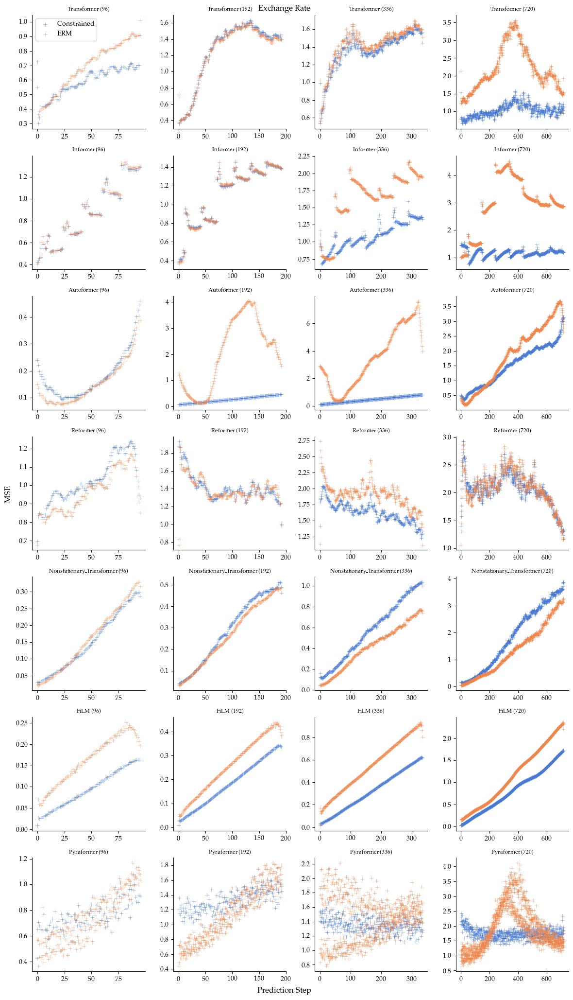

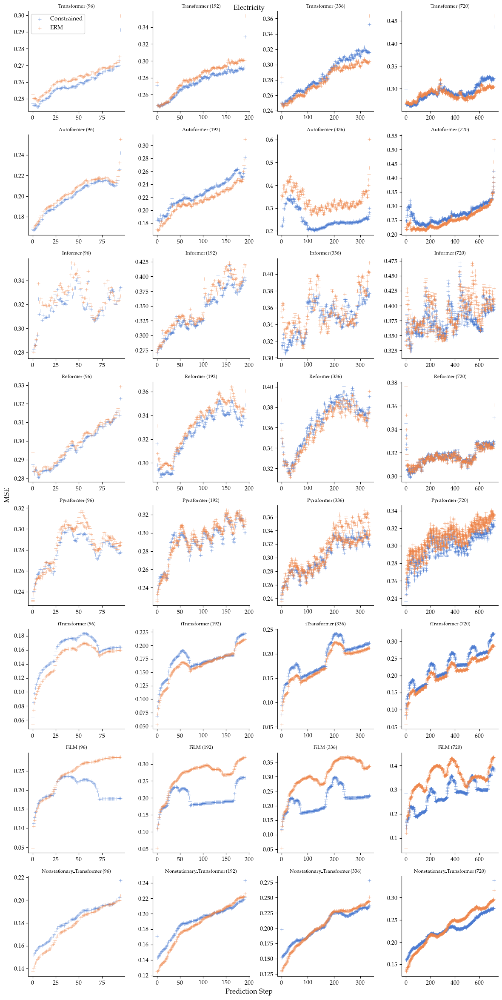

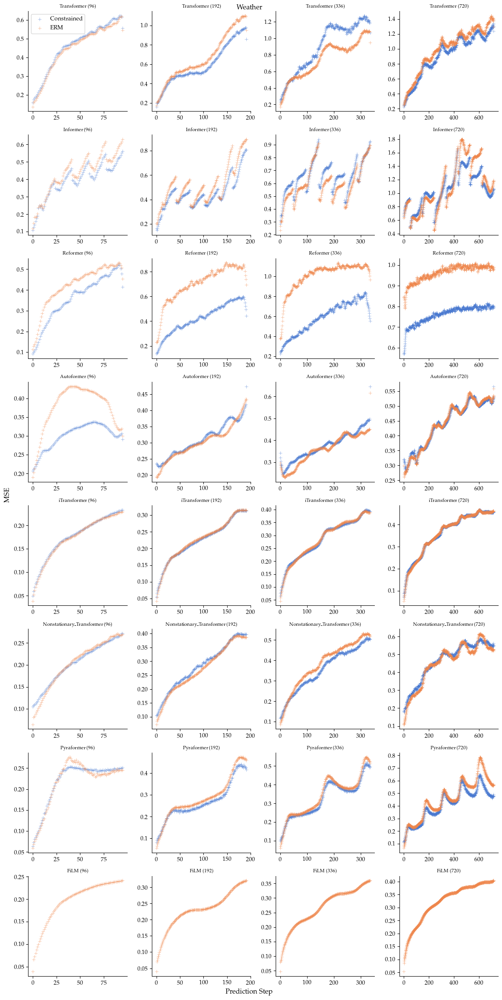

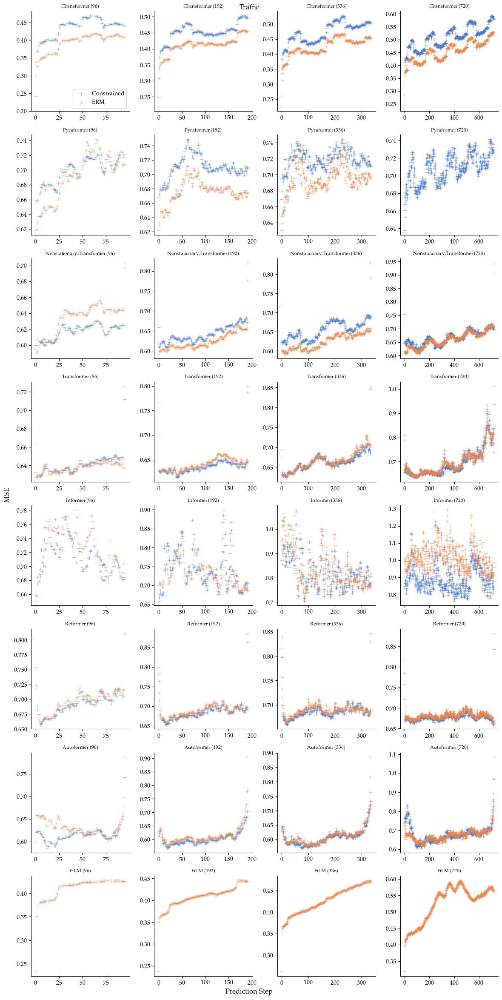

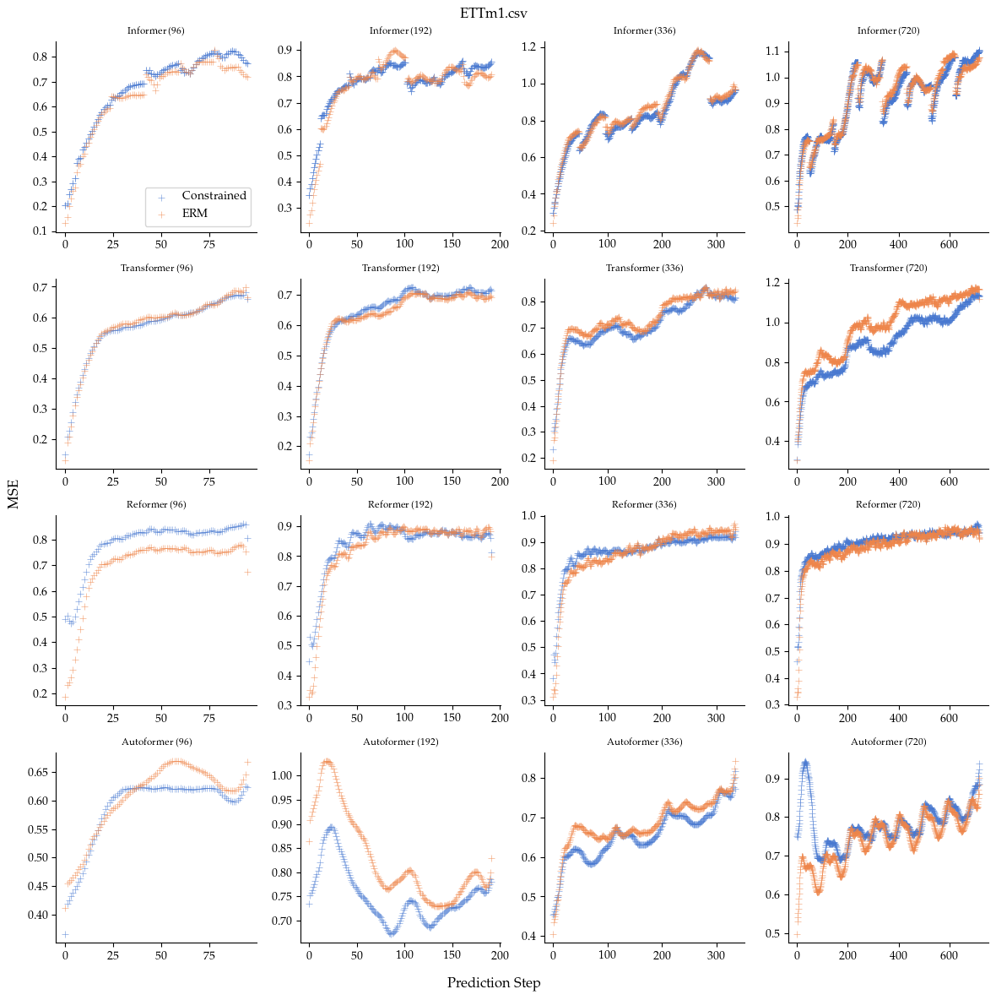

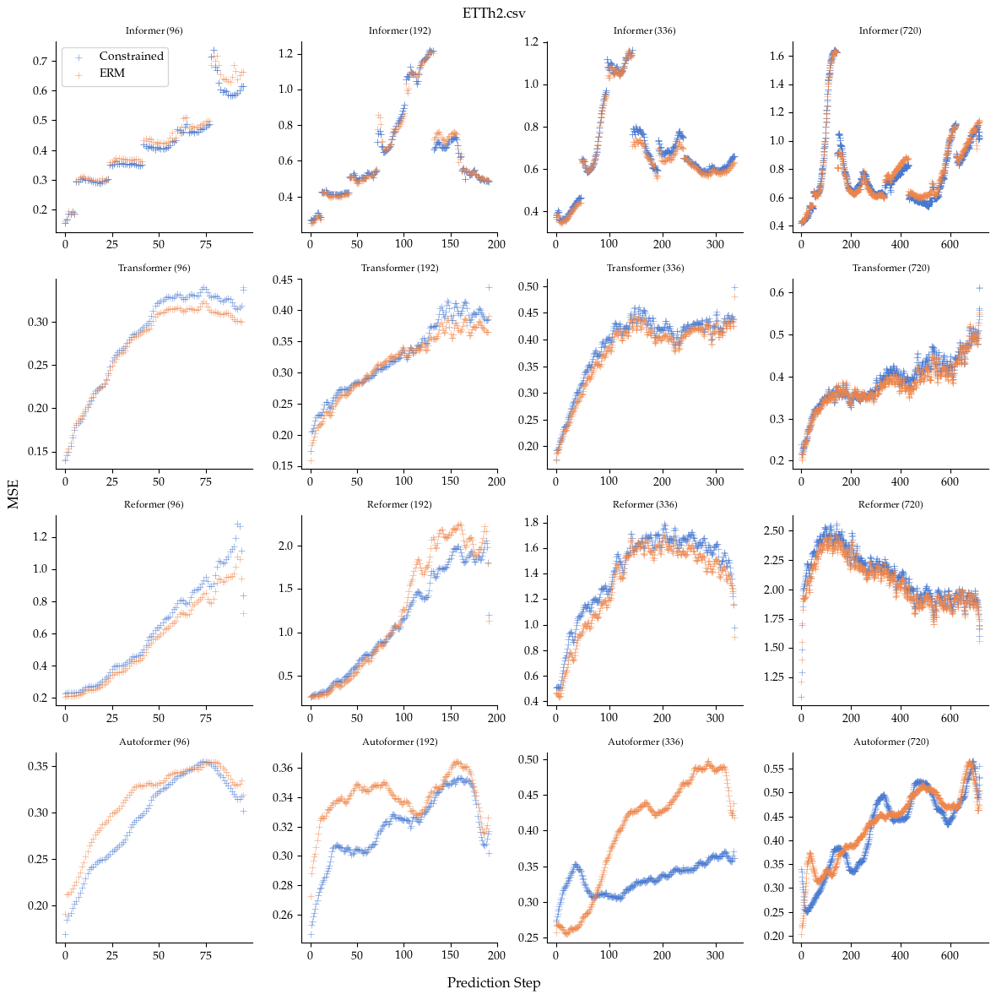

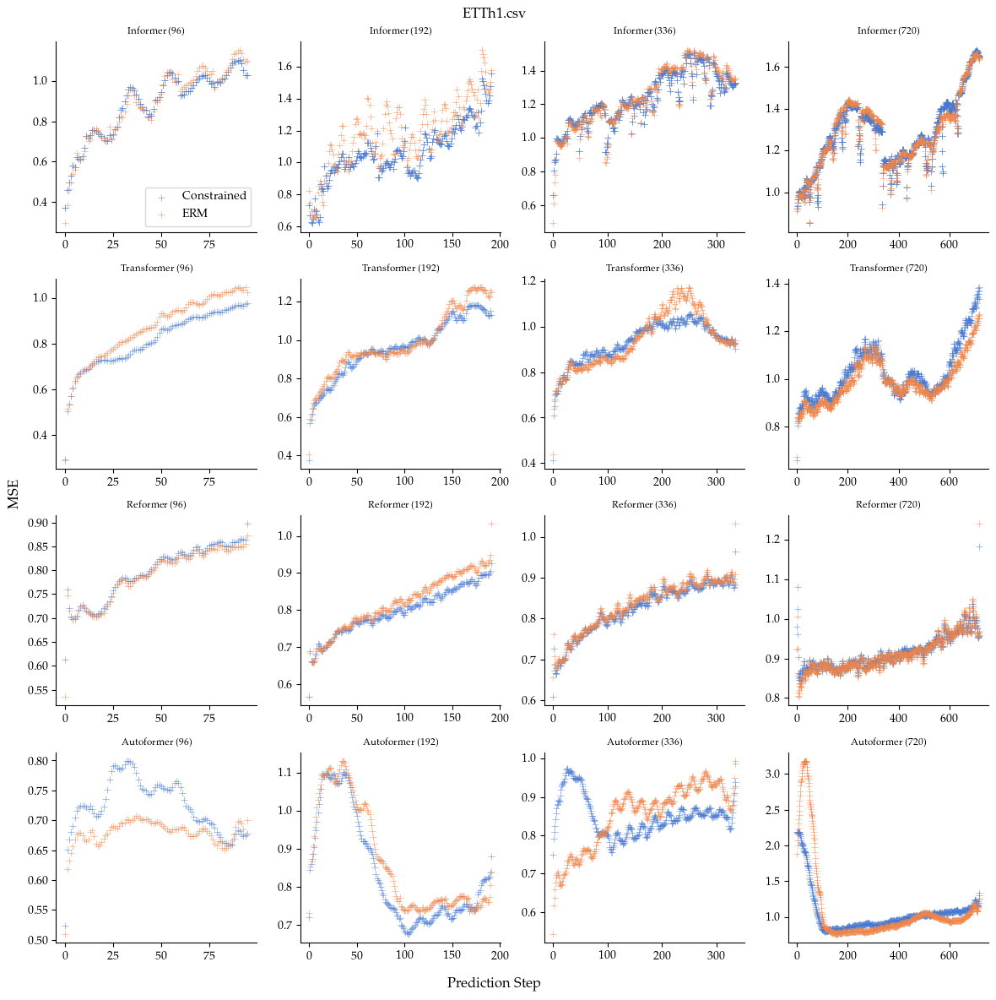

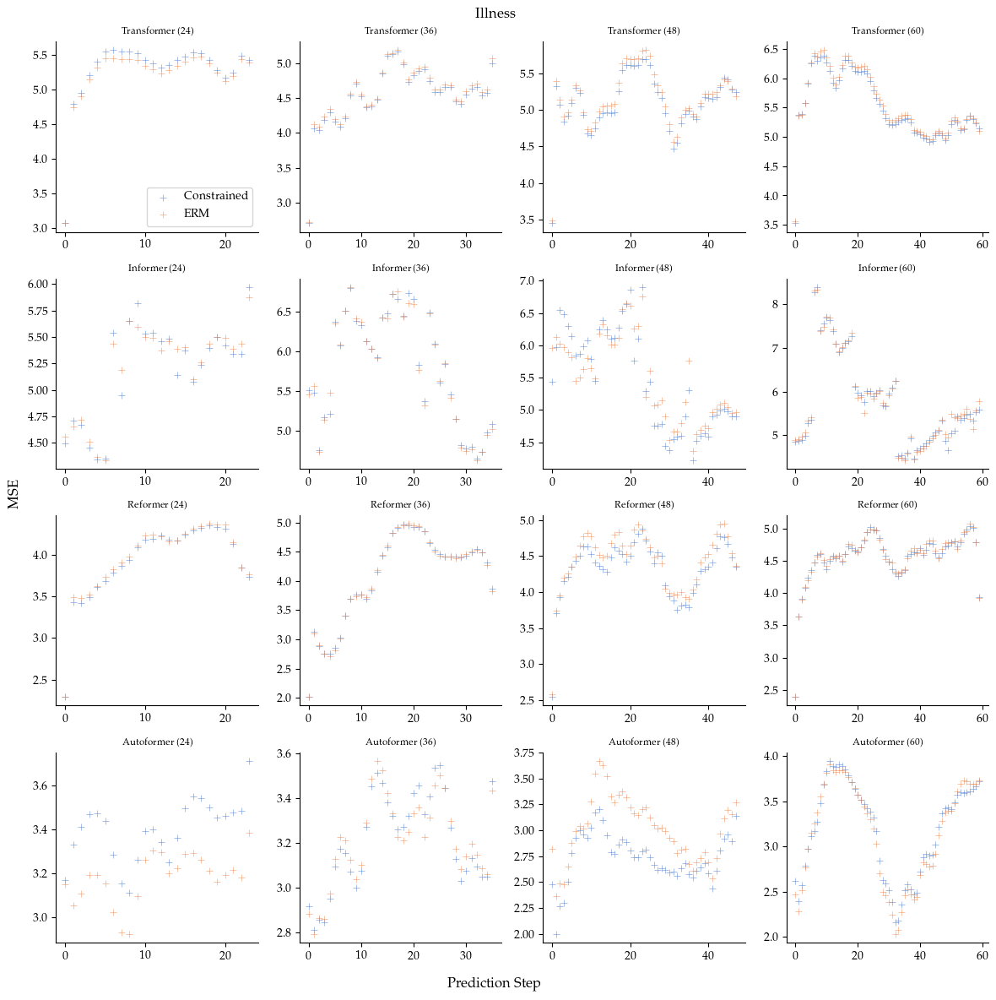

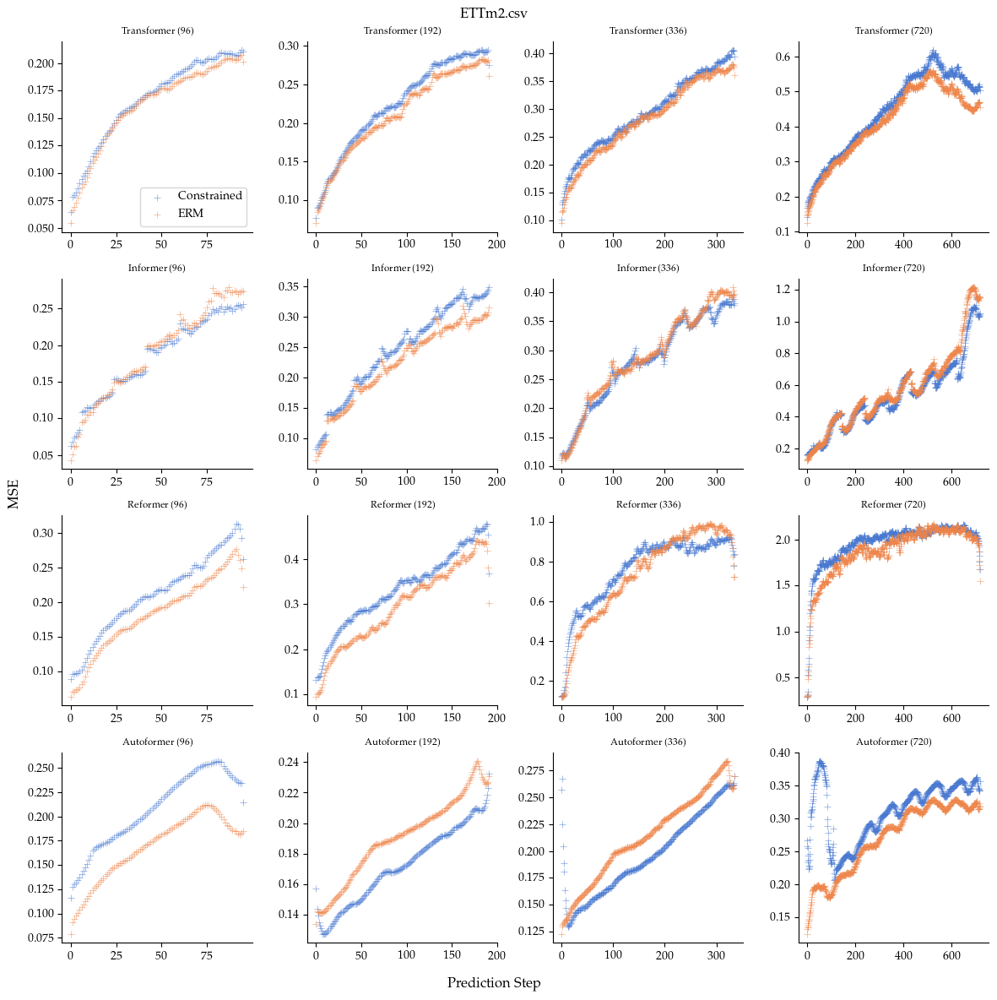

In [203]:
# PARAMS
split="test"
#constraint_idx = 1 # use the 50 percentile constraint to plot 1=25,2=50,3=75
seed=2021

sns.set_palette("muted")
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "font.serif": ["Palatino"],
})
mpl.rcParams['lines.linewidth'] = 1.8

# Filter
df_pct50_and_erm = df_to_plot[(df_to_plot.split==split) & (df_to_plot.constraint_type!='constant_resilience')].copy()

PRED_LENS=sorted(df_to_plot.pred_len.unique().tolist())
#PRED_LENS=[720]
#PRED_LENS=[96]

def pretty_name_dataset(data_path):
    if data_path=="electricity.csv": 
        return "Electricity"
    if data_path=="weather.csv":
        return "Weather"
    if data_path=="exchange_rate.csv":
        return "Exchange Rate"
    if data_path=="traffic.csv":
        return "Traffic"
    if data_path=="national_illness.csv":
        return "Illness"
    else: 
        print(f"Warning didnt find dataset {data_path}")
        return data_path

def sample_every_n(df,groupcols=['data_path','model','pred_len','split'],n=2):
    """
    Returns DF but only every nth row with respect to step within each group.
    """
    df_sampled = df.groupby(groupcols).apply(lambda x: x[(x.step//48)%n==0]).reset_index(drop=True)
    return df_sampled
    

#for pred_len in PRED_LENS:
for data_path in df_pct50_and_erm.data_path.unique():
    # Add data for constant line
    #df_current_plot = df_pct50_and_erm.query('pred_len==@pred_len').copy()
    df_current_plot = df_pct50_and_erm.query('data_path==@data_path').copy()
    df_current_plot['constraint_type'].replace({'erm':'ERM','constant':'Constrained'},inplace=True)
    #constraint_level = df_current_plot.constraint_level.unique()[0]
    #df_current_plot['constraint_level'] = constraint_level
    #display(Markdown(f"#### **ERM Vs Constrained {pred_len} (split={split})**"))
    #debug line:
    #df_current_plot.query("model=='FiLM' and constraint_type=='Constrained' and data_path=="weather.csv"").shape

    g = sns.FacetGrid(
                    #sample_every_n(df_current_plot),
                    df_current_plot,
                    #df_current_plot,
                    row='model', 
                    col='pred_len', 
                    hue='constraint_type', 
                    height=3, 
                    aspect=1.0, 
                    legend_out=False,
                    #legend='full',
                    sharex=False,
                    sharey=False,
                    )
    #g.set_titles(row_template="", col_template="")
    
    #g.map(sns.lineplot, "step", "constraint_level", alpha=.7)
    g.map(sns.scatterplot, "step", "mse",marker='+',alpha=0.7,legend='full',edgecolor=None)
    g.add_legend()
    
    g.set_xlabels("")
    g.set_ylabels("")
    g.set_titles(template="{row_name} ({col_name})")
    g.fig.supxlabel("Prediction Step")
    g.fig.supylabel("MSE")
    g.fig.suptitle(f'{pretty_name_dataset(data_path)}')
    for ax in g.axes.flat:
        ax.set_title(ax.get_title(), fontsize='small')
        ax.set_xlabel(ax.get_xlabel(), fontsize='large')
        ax.set_ylabel(ax.get_ylabel(), fontsize='large')

    # make markers bigger
    for ax in g.axes.flat:
        for p in ax.patches:
            p.set( markersize=20)
    # disable legend
    #g._legend.remove()
    g._legend.set_title("")
    # legend fontsizesmall
    #g._legend.texts
    #g._legend.set_frame_on(False)
    # tight layout
    g.fig.tight_layout()
    
    #TODO fix and uncomment
    name_without_extension = data_path.split(".")[0]
    g.savefig(f"{FIGURES_FOLDER}/constrained_vs_erm_all_{name_without_extension}.pdf")
    #plt.show()

## ERM Vs Constrained parameterized on split (NO GS)
Using non gridsearch data to explore the results

Warning didnt find dataset ETTm1.csv
Warning didnt find dataset ETTh2.csv
Warning didnt find dataset ETTh1.csv
Warning didnt find dataset ETTm2.csv


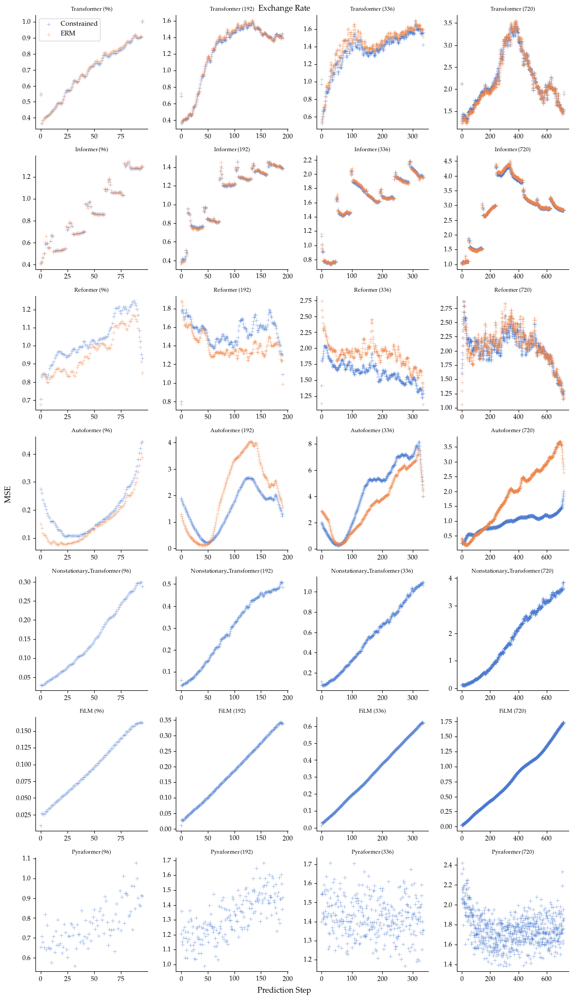

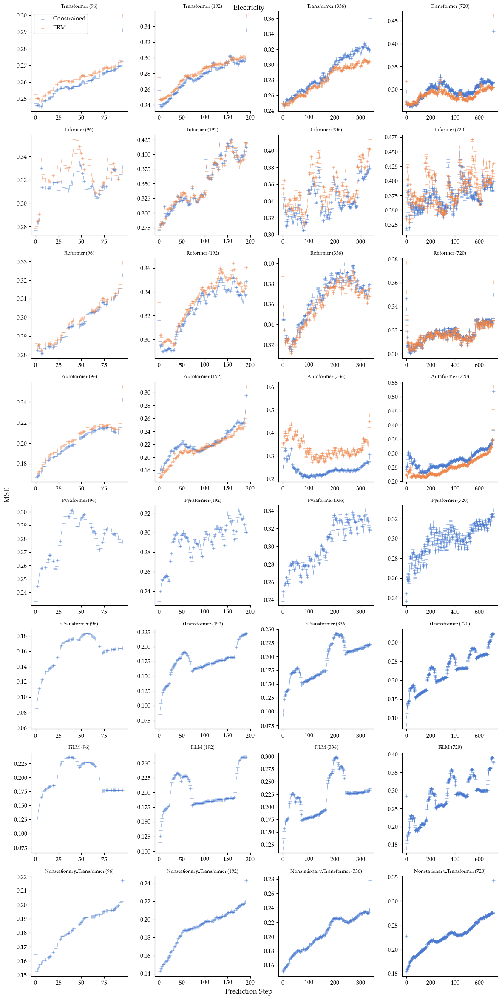

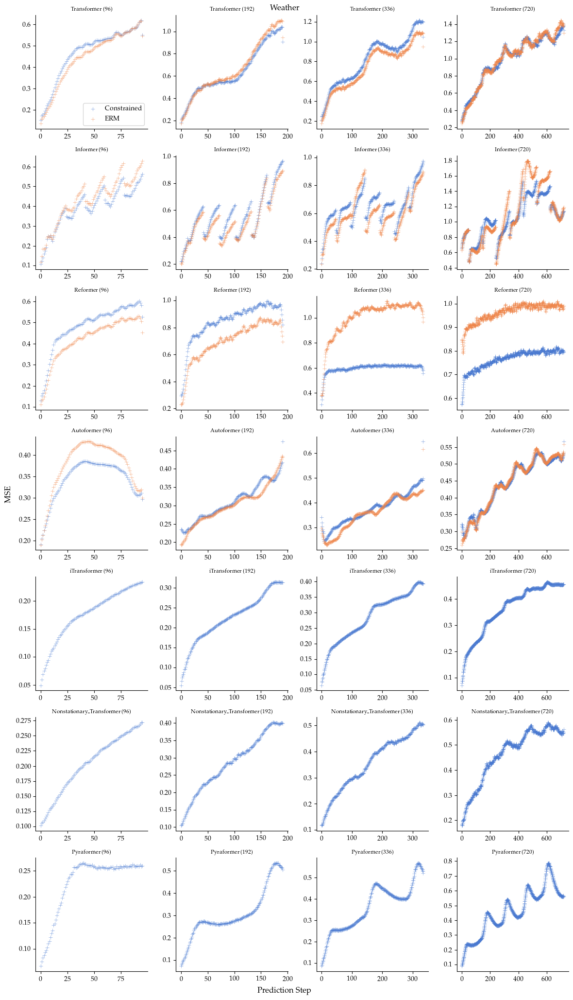

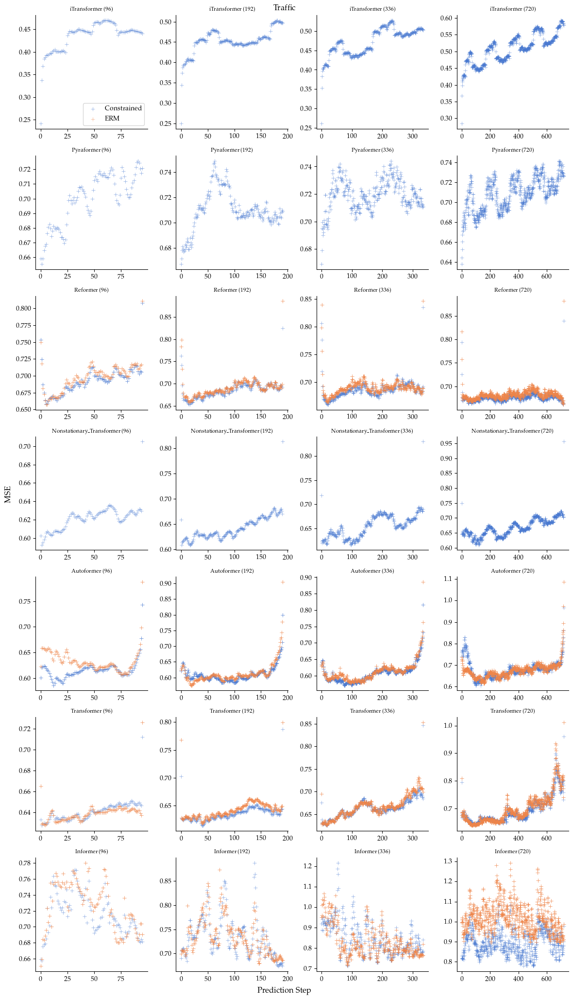

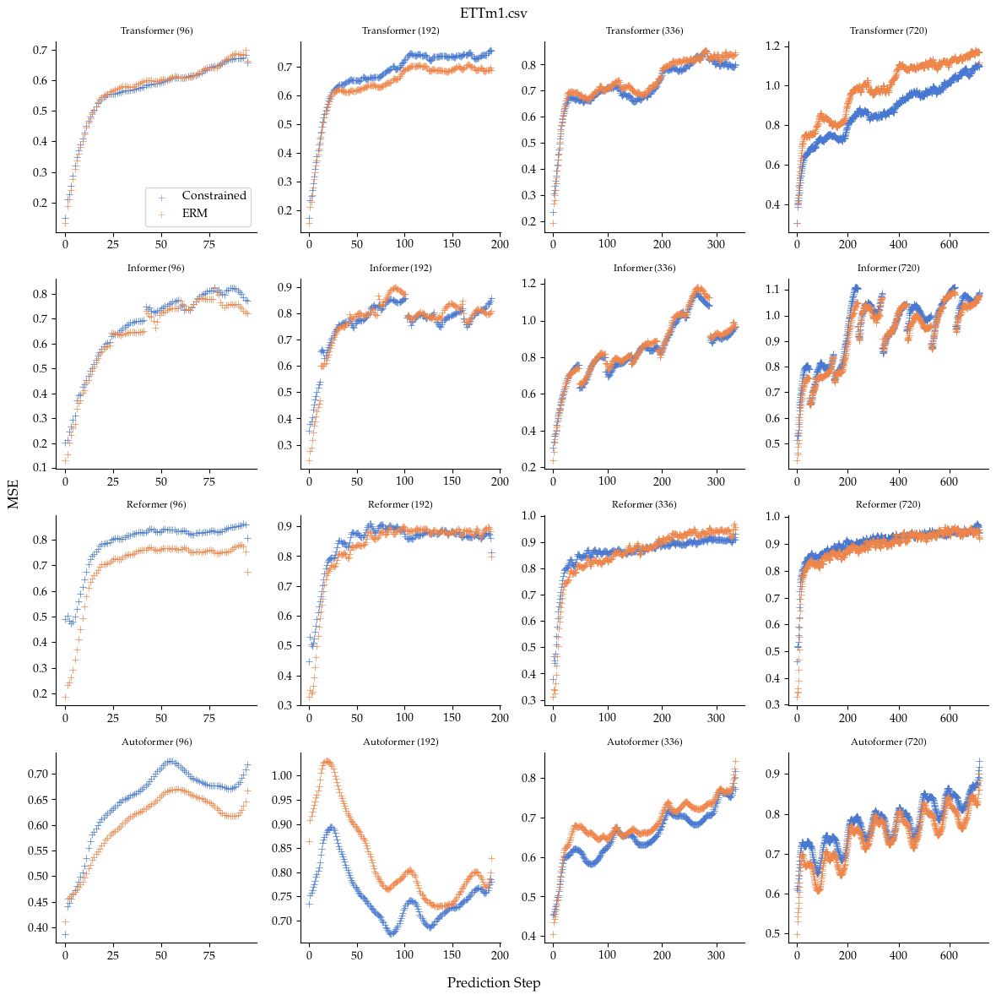

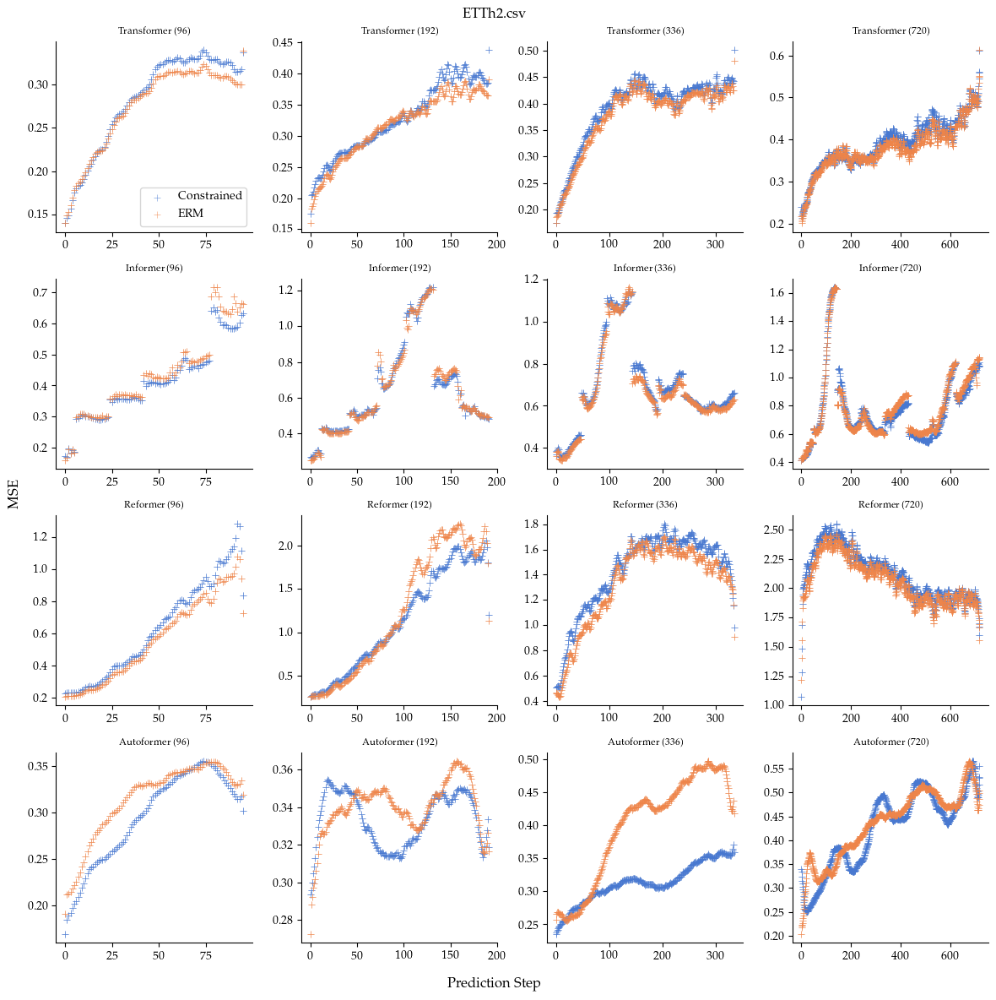

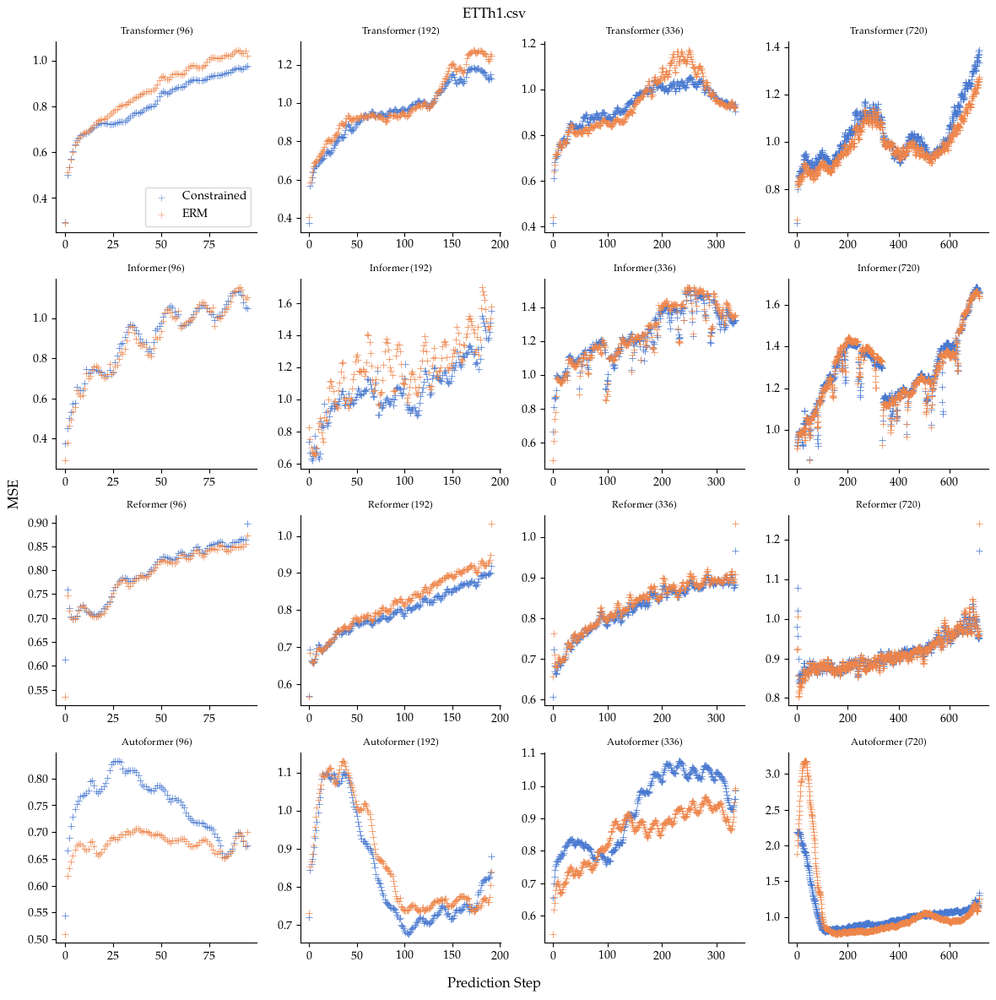

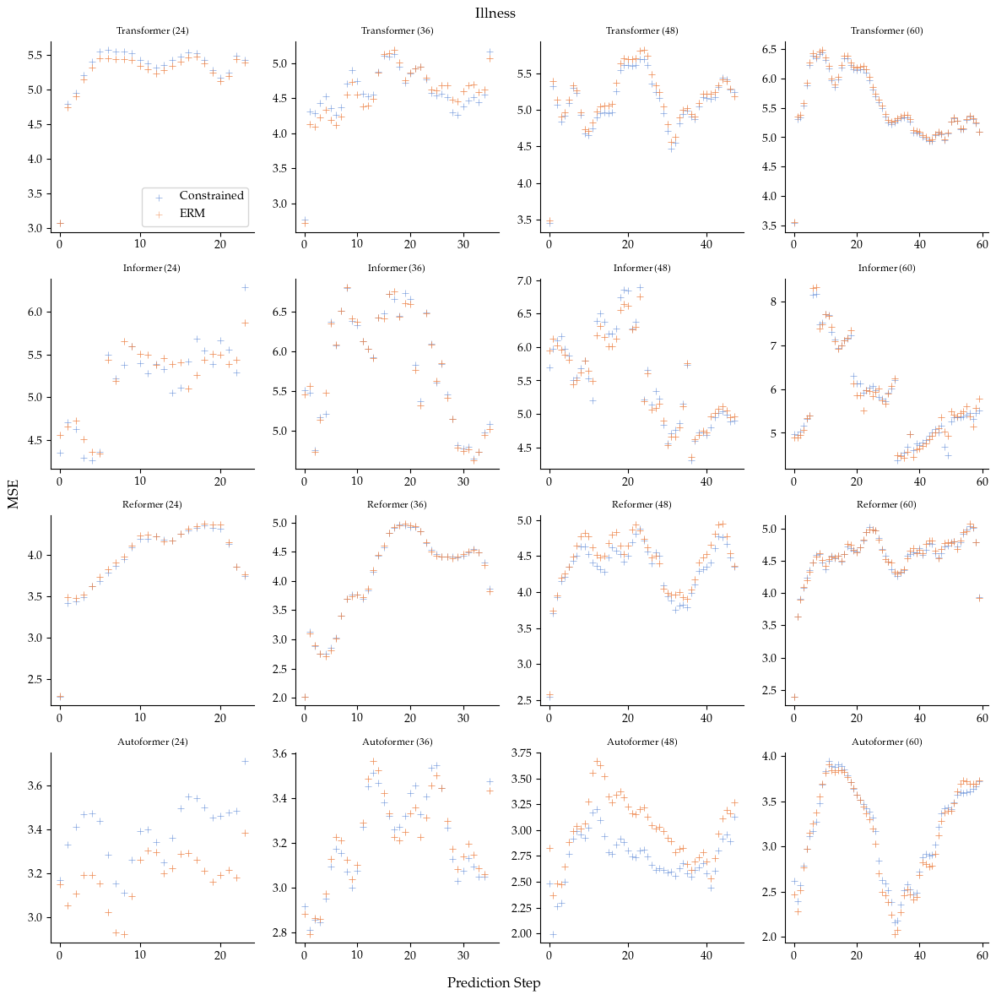

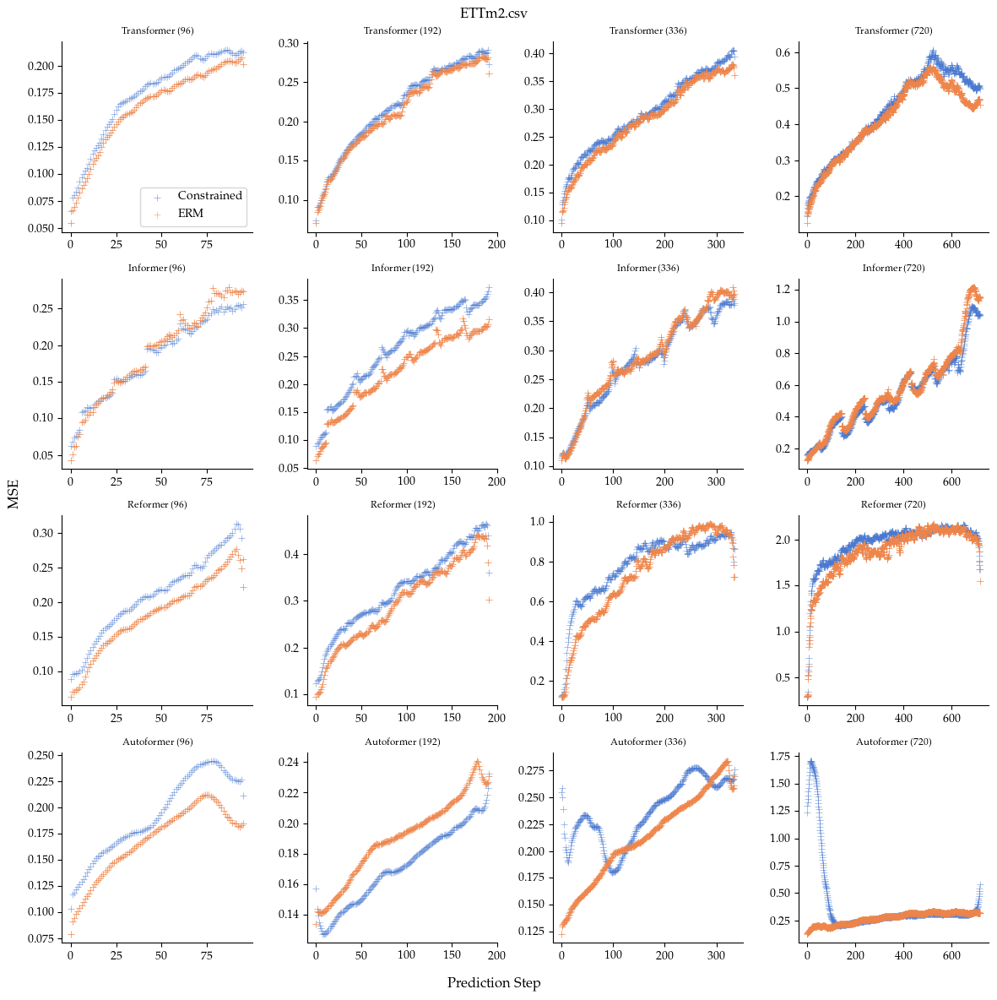

In [141]:
# PARAMS
split="test"
constraint_idx = 1 # use 25% to see the highest multipliers to plot 1=25,2=50,3=75
seed=2021

sns.set_palette("muted")
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "font.serif": ["Palatino"],
})
mpl.rcParams['lines.linewidth'] = 1.8

# Filter
df_pct50_and_erm = df_to_plot_nogs[(df_to_plot_nogs.seed==seed) & 
                                   (df_to_plot_nogs.split==split) & 
                                   (df_to_plot_nogs.constraint_type!='constant_resilience') & 
                                   (df_to_plot_nogs.constraint_idx==constraint_idx)].copy()

PRED_LENS=sorted(df_to_plot_nogs.pred_len.unique().tolist())
#PRED_LENS=[720]
#PRED_LENS=[96]

def pretty_name_dataset(data_path):
    if data_path=="electricity.csv": 
        return "Electricity"
    if data_path=="weather.csv":
        return "Weather"
    if data_path=="exchange_rate.csv":
        return "Exchange Rate"
    if data_path=="traffic.csv":
        return "Traffic"
    if data_path=="national_illness.csv":
        return "Illness"
    else: 
        print(f"Warning didnt find dataset {data_path}")
        return data_path

def sample_every_n(df,groupcols=['data_path','model','pred_len','split'],n=2):
    """
    Returns DF but only every nth row with respect to step within each group.
    """
    df_sampled = df.groupby(groupcols).apply(lambda x: x[(x.step//48)%n==0]).reset_index(drop=True)
    return df_sampled
    

#for pred_len in PRED_LENS:
for data_path in df_pct50_and_erm.data_path.unique():
    # Add data for constant line
    #df_current_plot = df_pct50_and_erm.query('pred_len==@pred_len').copy()
    df_current_plot = df_pct50_and_erm.query('data_path==@data_path').copy()
    df_current_plot['constraint_type'].replace({'erm':'ERM','constant':'Constrained'},inplace=True)
    #constraint_level = df_current_plot.constraint_level.unique()[0]
    #df_current_plot['constraint_level'] = constraint_level
    #display(Markdown(f"#### **ERM Vs Constrained {pred_len} (split={split})**"))

    g = sns.FacetGrid(
                    #sample_every_n(df_current_plot),
                    df_current_plot,
                    #df_current_plot,
                    row='model', 
                    col='pred_len', 
                    hue='constraint_type', 
                    height=3, 
                    aspect=1.0, 
                    legend_out=False,
                    #legend='full',
                    sharex=False,
                    sharey=False,
                    )
    #g.set_titles(row_template="", col_template="")
    
    #g.map(sns.lineplot, "step", "constraint_level", alpha=.7)
    g.map(sns.scatterplot, "step", "mse",marker='+',alpha=0.7,legend='full',edgecolor=None)
    g.add_legend()
    
    g.set_xlabels("")
    g.set_ylabels("")
    g.set_titles(template="{row_name} ({col_name})")
    g.fig.supxlabel("Prediction Step")
    g.fig.supylabel("MSE")
    g.fig.suptitle(f'{pretty_name_dataset(data_path)}')
    for ax in g.axes.flat:
        ax.set_title(ax.get_title(), fontsize='small')
        ax.set_xlabel(ax.get_xlabel(), fontsize='large')
        ax.set_ylabel(ax.get_ylabel(), fontsize='large')

    # make markers bigger
    for ax in g.axes.flat:
        for p in ax.patches:
            p.set( markersize=20)
    # disable legend
    #g._legend.remove()
    g._legend.set_title("")
    # legend fontsizesmall
    #g._legend.texts
    #g._legend.set_frame_on(False)
    # tight layout
    g.fig.tight_layout()
    
    #TODO fix and uncomment
    name_without_extension = data_path.split(".")[0]
    g.savefig(f"{FIGURES_FOLDER}/constrained_vs_erm_all_nogs_{name_without_extension}.pdf")
    #plt.show()

### Train vs test

#### **ERM Vs Constrained exchange_rate.csv--96**

#### **ERM Vs Constrained exchange_rate.csv--96**

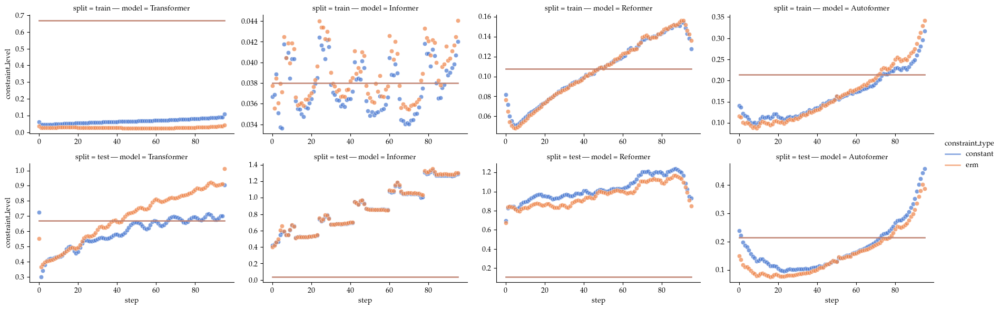

#### **ERM Vs Constrained exchange_rate.csv--192**

#### **ERM Vs Constrained exchange_rate.csv--192**

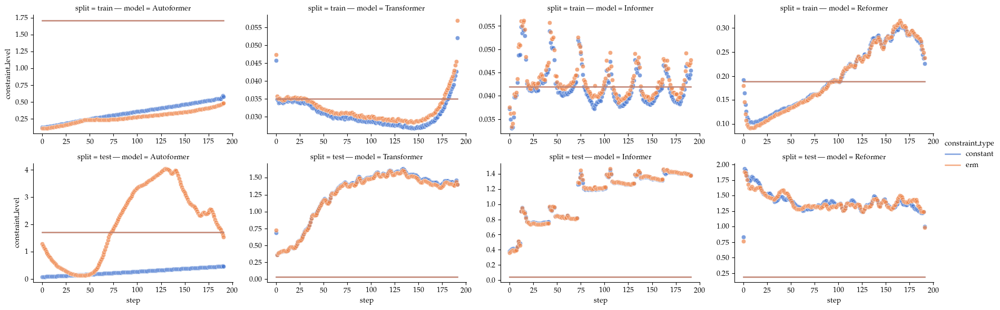

#### **ERM Vs Constrained exchange_rate.csv--336**

#### **ERM Vs Constrained exchange_rate.csv--336**

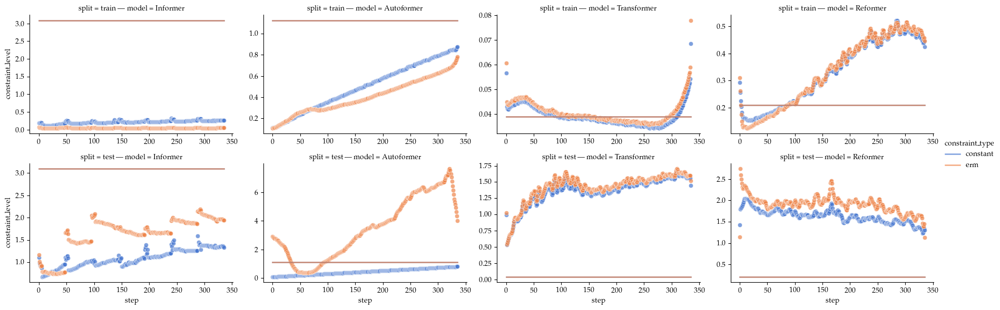

#### **ERM Vs Constrained exchange_rate.csv--720**

#### **ERM Vs Constrained exchange_rate.csv--720**

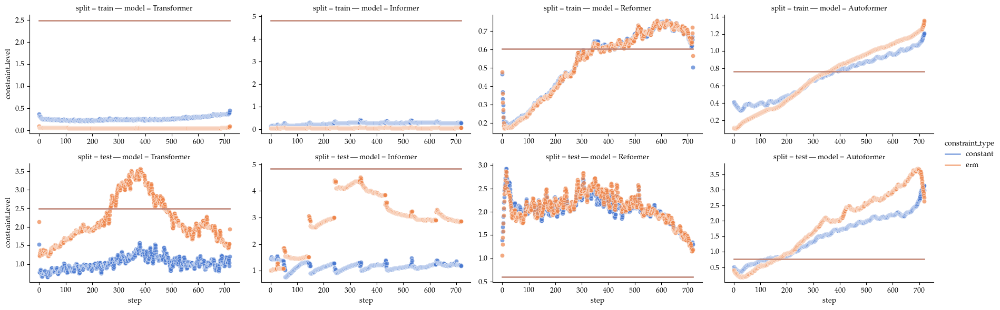

#### **ERM Vs Constrained electricity.csv--96**

#### **ERM Vs Constrained electricity.csv--96**

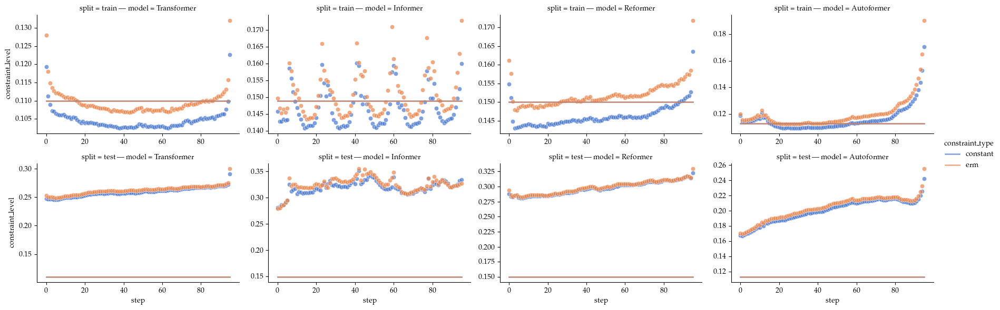

#### **ERM Vs Constrained electricity.csv--192**

#### **ERM Vs Constrained electricity.csv--192**

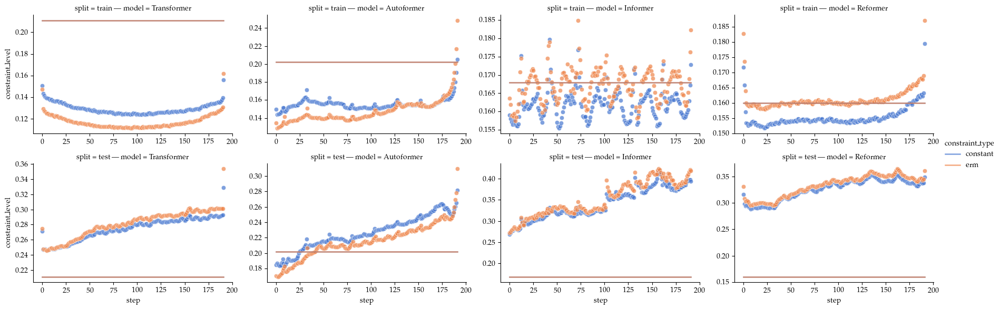

#### **ERM Vs Constrained electricity.csv--336**

#### **ERM Vs Constrained electricity.csv--336**

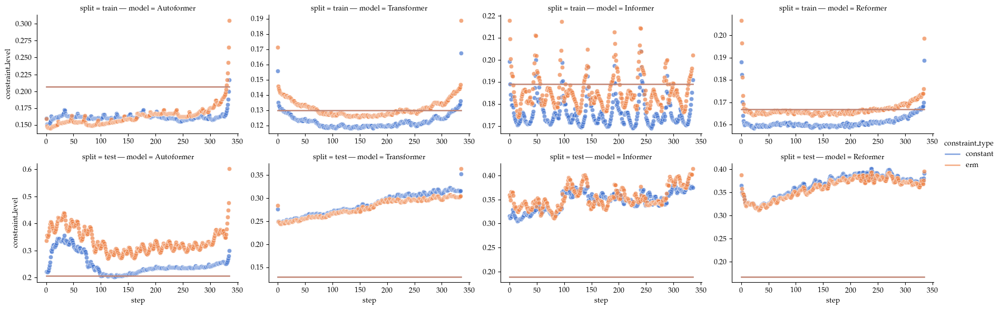

#### **ERM Vs Constrained electricity.csv--720**

#### **ERM Vs Constrained electricity.csv--720**

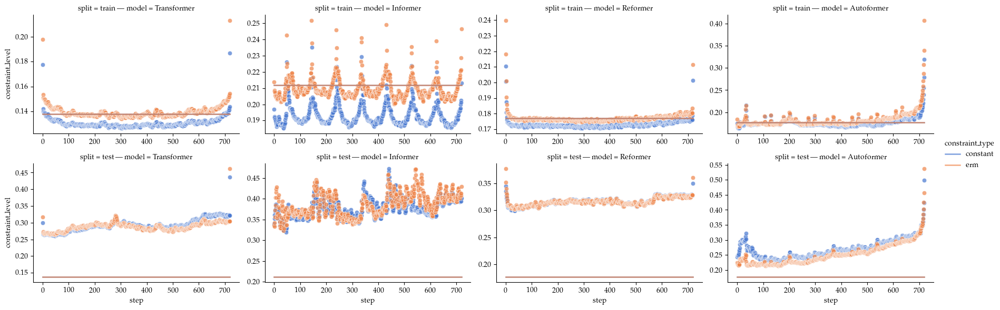

#### **ERM Vs Constrained weather.csv--96**

#### **ERM Vs Constrained weather.csv--96**

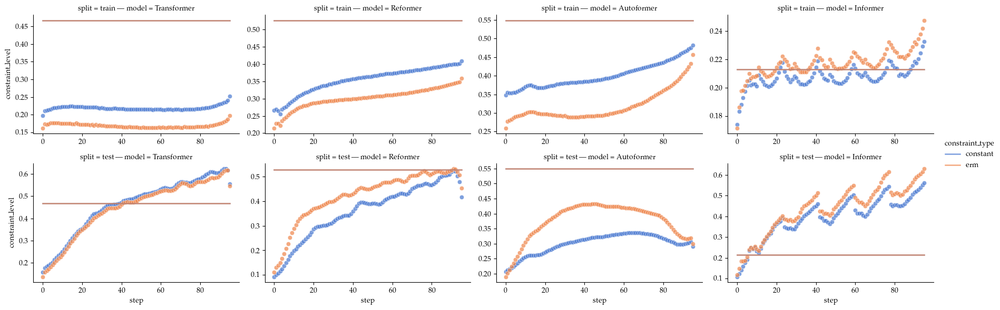

#### **ERM Vs Constrained weather.csv--192**

#### **ERM Vs Constrained weather.csv--192**

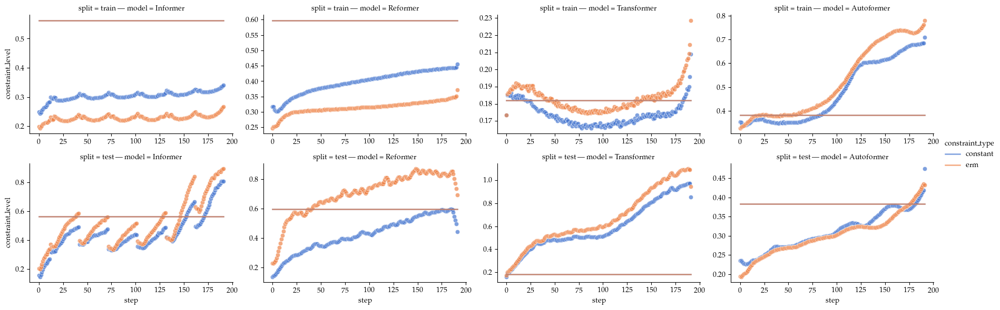

#### **ERM Vs Constrained weather.csv--336**

#### **ERM Vs Constrained weather.csv--336**

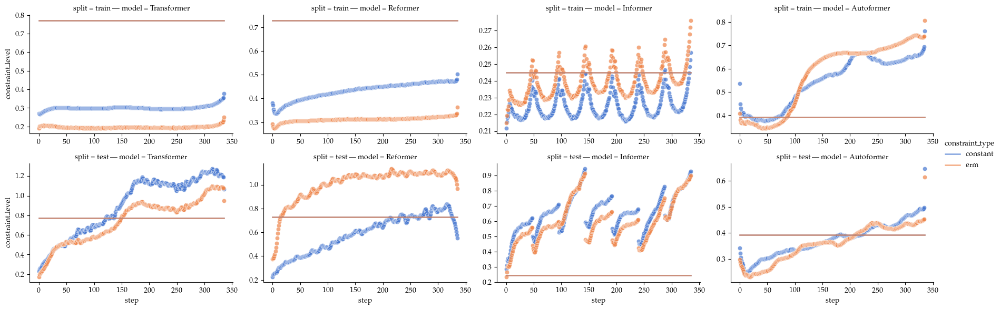

#### **ERM Vs Constrained weather.csv--720**

#### **ERM Vs Constrained weather.csv--720**

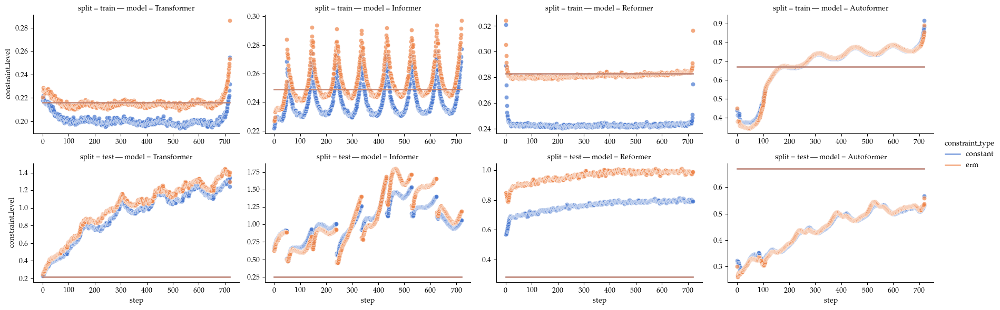

In [37]:
# PARAMS
#split="test"
#constraint_idx = 1 # use the 50 percentile constraint to plot 1=25,2=50,3=75
seed=2021

# Filter
df_pct50_and_erm = df_to_plot[(df_to_plot.seed==seed) & (df_to_plot.split.isin(['train','test'])) & (df_to_plot.constraint_type.isin(['erm','constant']))].copy()

PRED_LENS=sorted(df_to_plot.pred_len.unique().tolist())
#PRED_LENS=[720]
#PRED_LENS=[96]
#for model in df_to_plot.model.unique():
for data_path in df_to_plot.data_path.unique():
    for pred_len in PRED_LENS:
        # Add data for constant line
        df_current_plot = df_pct50_and_erm.query('pred_len==@pred_len and data_path==@data_path').copy()
        mses=df_current_plot.groupby(['model','split','constraint_type'])['mse'].mean().reset_index()
        # plot only if train constant is lower than train erm and test constant is higher than test erm
        # if mses.query('split=="train"').query('constraint_type=="constant"').mse.values[0] < mses.query('split=="train"').query('constraint_type=="erm"').mse.values[0] and \
        #     mses.query('split=="test"').query('constraint_type=="constant"').mse.values[0] > mses.query('split=="test"').query('constraint_type=="erm"').mse.values[0]:
        display(Markdown(f"#### **ERM Vs Constrained {data_path}--{pred_len}**"))
    
        #constraint_level = df_current_plot.constraint_level.unique()[0]
        #df_current_plot['constraint_level'] = constraint_level
        display(Markdown(f"#### **ERM Vs Constrained {data_path}--{pred_len}**"))

        g = sns.FacetGrid(df_current_plot, col='model', row='split', hue='constraint_type', height=3, aspect=1.5, legend_out=True,sharex=False,sharey=False)
        #g.map(sns.lineplot, "step", "constraint_level", alpha=.7)
        g.map(sns.scatterplot, "step", "mse", alpha=.7)
        g.map(sns.lineplot, "step", "constraint_level", alpha=.7)
        g.add_legend()
        #TODO fix and uncomment
        #g.savefig(f"{FIGURES_FOLDER}/constrained_vs_erm_{pred_len}_{str(constraint_level).replace('.','')}.png")
        plt.show()

#### Train vs test select example!!!

(424, 111)
success


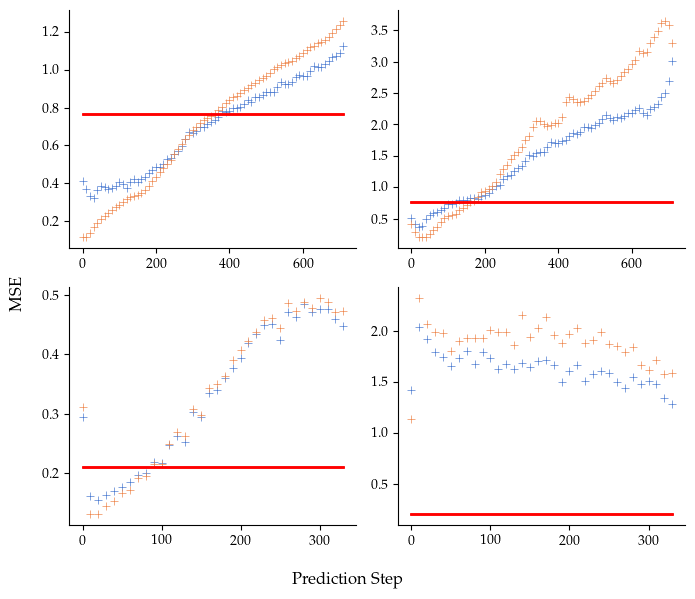

(2112, 111)
failures


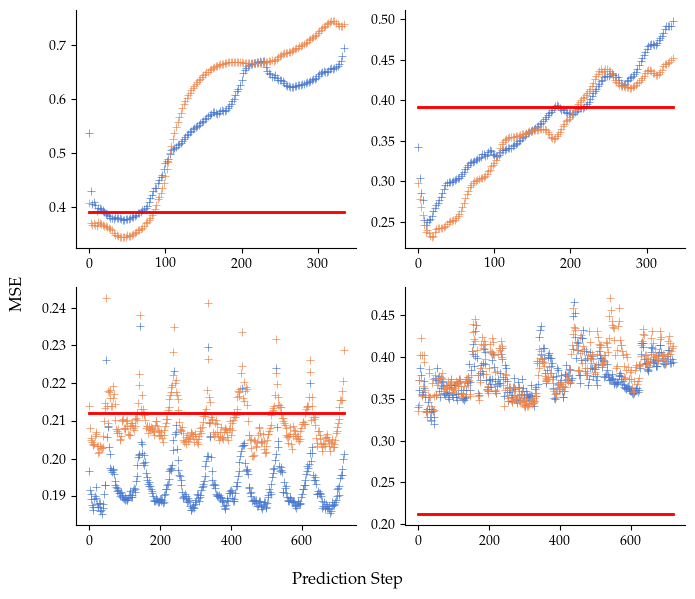

In [ ]:
import matplotlib as mpl
# Get the two success cases and two failures cases in separate dfs
# constant and erm
#**ECL192 transformer**
#**Weather 192 REformer
#Drop this one in favor of a more textbook one
#success1 = df_to_plot.query('data_path=="electricity.csv" and pred_len==192 and split!="val" and model=="Transformer" and (constraint_type=="constant" or constraint_type=="erm")').copy()
success1 = df_to_plot.query('data_path=="exchange_rate.csv" and pred_len==720 and split!="val" and model=="Autoformer" and (constraint_type=="constant" or constraint_type=="erm")').copy()
success2 = df_to_plot.query('data_path=="exchange_rate.csv" and pred_len==336 and split!="val" and model=="Reformer" and (constraint_type=="constant" or constraint_type=="erm")').copy()
#**Weather 332 Autoformer**
#**Electricity 720 Informer**
failure1 = df_to_plot.query('data_path=="weather.csv" and pred_len==336 and split!="val" and model=="Autoformer" and (constraint_type=="constant" or constraint_type=="erm")').copy()
failure2 = df_to_plot.query('data_path=="electricity.csv" and pred_len==720 and split!="val" and model=="Informer" and (constraint_type=="constant" or constraint_type=="erm")').copy()


sns.set_palette("muted")
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "font.serif": ["Palatino"],
})
mpl.rcParams['lines.linewidth'] = 1.8

# add only one x axis label
g.set_xlabels("")
g.set_ylabels("")
# set axis label at the figure level
# add the hline
# for ax in g.axes:
#     ax.axhline(y=constraint_level, color='r', linestyle='-')
g.fig.supxlabel("Prediction Step")
g.fig.supylabel("MSE")


#TODO
g.set_titles(col_template="{col_name}")


# evens = df_set1["step"]%10
# df_set1 = df_set1[evens==0]
# evens = df_set2["step"]%2
# df_set2 = df_set2[evens==0]

    
# Plot all cases
success = pd.concat([success1,success2])
failures = pd.concat([failure1,failure2])
for plot_data,figname in [
    # (success1,"success_electricity_transformer_192"),
    # (success2,"success_weather_reformer_192"),
    # (failure1,"failure_weather_autoformer_332"),
    # (failure2,"failure_electricity_informer_720")
    (success,"success"),
    (failures,"failures")
    ]:
    # print(failure1.shape)
    # print(failure2.shape)
    if plot_data.pred_len.iloc[0]>500:
        evens = plot_data["step"]%10
        plot_data = plot_data[evens==0]
    # elif plot_data.pred_len.iloc[0]==336:
    #     evens = plot_data["step"]%4
    #     plot_data = plot_data[evens==0]
    else: 
        evens = plot_data["step"]%2
        plot_data = plot_data[evens==0]
    print(plot_data.shape)
    print(figname)
    g = sns.FacetGrid(plot_data, row="model",col='split', hue='constraint_type', height=3, aspect=1.0, legend_out=True,sharex=False,sharey=False)
    g.map(sns.scatterplot, "step", "mse", legend='full', marker='+')
    g.map(sns.lineplot, "step", "constraint_level", legend='full',color='red')
    
    g.add_legend()
    
    g.set_xlabels("")
    g.set_ylabels("")
    g.set_titles(col_template="{col_name}")
    g.fig.supxlabel("Prediction Step")
    g.fig.supylabel("MSE")
    for ax in g.axes.flat:
        ax.set_title("", fontsize='large')
        ax.set_xlabel(ax.get_xlabel(), fontsize='large')
        ax.set_ylabel(ax.get_ylabel(), fontsize='large')

    # make markers bigger
    for ax in g.axes.flat:
        for p in ax.patches:
            p.set( markersize=20)
    # disable legend
    g._legend.remove()
    # tight layout
    g.fig.tight_layout()
    g.savefig(f"../figures/icml/{figname}.pdf")
    plt.show()

# g = sns.FacetGrid(df_current_plot, col='model', row='split', hue='constraint_type', height=3, aspect=1.5, legend_out=True,sharex=False,sharey=False)
# #g.map(sns.lineplot, "step", "constraint_level", alpha=.7)
# g.map(sns.scatterplot, "step", "mse", alpha=.7)
# g.add_legend()
# #TODO fix and uncomment
# #g.savefig(f"{FIGURES_FOLDER}/constrained_vs_erm_{pred_len}_{str(constraint_level).replace('.','')}.png")
# plt.show()

### Multipliers over the window

## REVIEWER: Multipliers

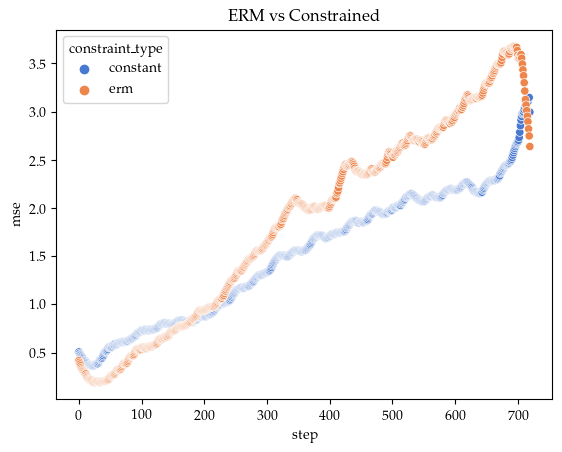

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


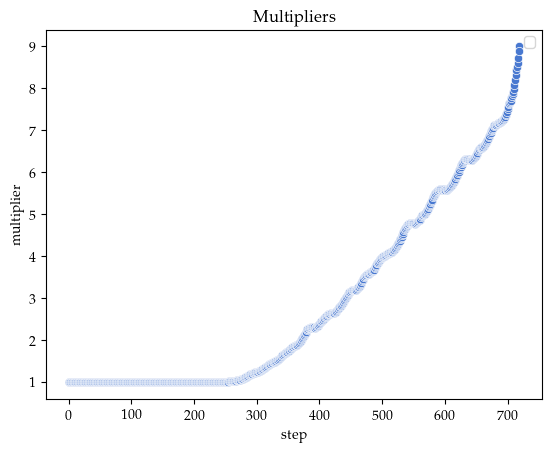

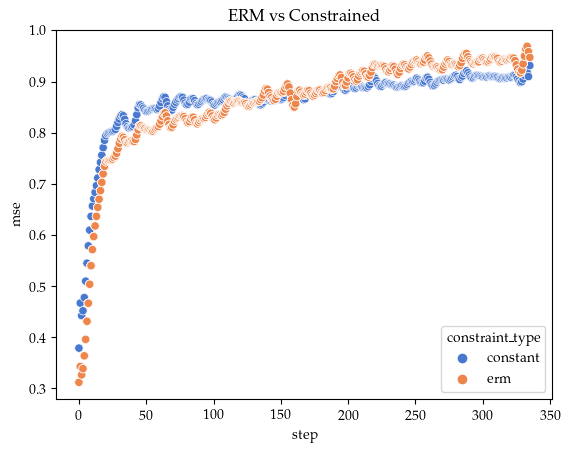

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


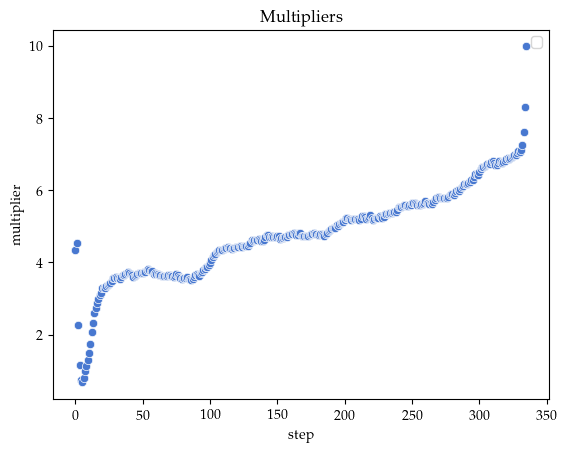

In [153]:
# PARAMS

# Filter
# example_one = df_to_plot[
#     (df_to_plot.constraint_idx.isin([0,constraint_idx])) 
#     & (df_to_plot.split==split)
#     & (df_to_plot.constraint_type=="constant")
#     & (df_to_plot.model=="Autoformer")
#     & (df_to_plot.pred_len==720)
#     ].copy()

example_one = df_to_plot.query('(constraint_type=="constant" or constraint_type=="erm") and data_path=="exchange_rate.csv" and model=="Autoformer" and pred_len==720')
#example_two = df_to_plot_nogs.query('((constraint_type=="constant" and constraint_idx==1) or constraint_type=="erm") and data_path=="weather.csv" and model=="Autoformer" and pred_len==96')
example_two = df_to_plot_nogs.query('((constraint_type=="constant" and constraint_idx==1) or constraint_type=="erm") and data_path=="ETTm1.csv" and model=="Reformer" and pred_len==336')
#display(example_one)
for data in [example_one,example_two]:
#for data in [example_two]:
    g1 = sns.scatterplot(data=data.query('split=="test"'),x="step", y="mse",hue='constraint_type')#, alpha=.7,color='red',label='Multiplier')
    g1.set_title("ERM vs Constrained")
    plt.show()
    g2 = sns.scatterplot(data=data.query("constraint_type=='constant'"),x="step", y="multiplier")#, alpha=.7,color='red',label='Multiplier')
    g2.legend()
    g2.set_title("Multipliers")
    plt.show()


In [ ]:
# PRED_LENS=sorted(df_to_plot.pred_len.unique().tolist())
# #PRED_LENS=[96]
# for pred_len in PRED_LENS:
#     # Add data for constant line
#     df_current_plot = df_pct50.query('pred_len==@pred_len').copy()
#     #constraint_level = df_current_plot.constraint_level.unique()[0]
#     #df_current_plot['constraint_level'] = constraint_level
#     display(Markdown(f"#### **Multipliers vs loss {pred_len} (split={split}, constraint_idx={constraint_idx})**"))

#     g = sns.FacetGrid(df_current_plot, col='model', row='data_path', height=3, aspect=1.5, legend_out=True)
#     # Plot multipliers and MSEs
#     g.map(sns.scatterplot, "step", "mse", alpha=.7,color='blue',label='MSE')
#     g.map(sns.scatterplot, "step", "multiplier", alpha=.7,color='red',label='Multiplier')
#     # Add legend the series

#     g.add_legend()
#     #g.savefig(f"{FIGURES_FOLDER}/constrained_vs_erm_{pred_len}_{str(constraint_level).replace('.','')}.png")
#     plt.show()

## ALL Multipliers

#### **Multipliers vs loss 24 (split=train, constraint_idx=1)**

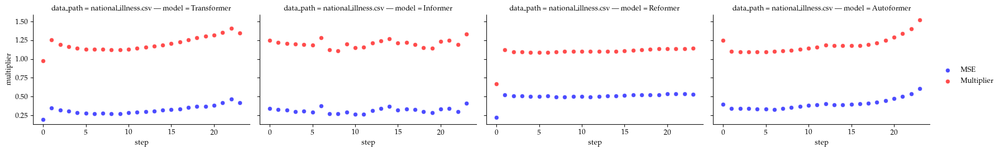

#### **Multipliers vs loss 36 (split=train, constraint_idx=1)**

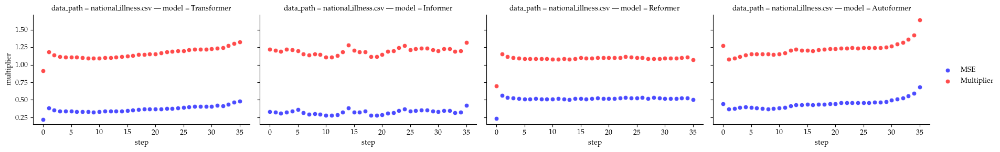

#### **Multipliers vs loss 48 (split=train, constraint_idx=1)**

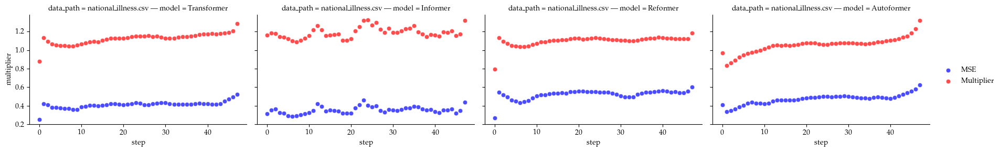

#### **Multipliers vs loss 60 (split=train, constraint_idx=1)**

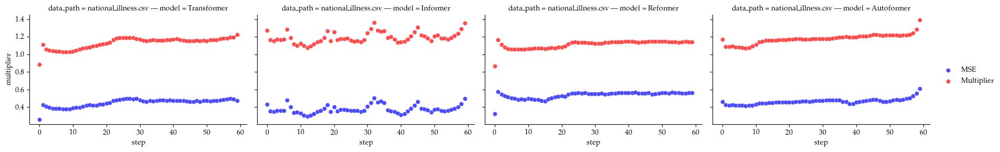

#### **Multipliers vs loss 96 (split=train, constraint_idx=1)**

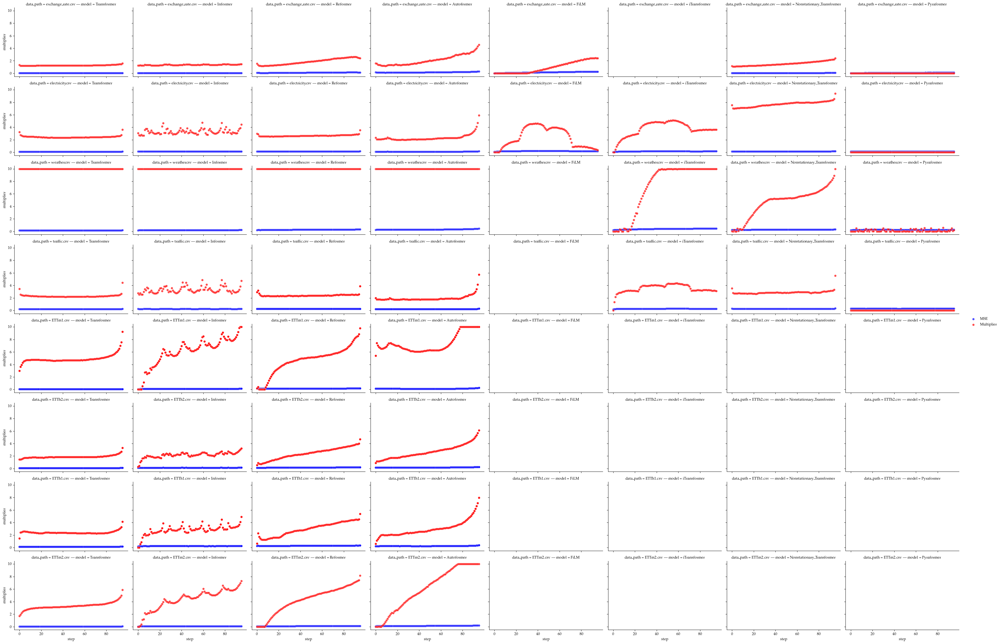

#### **Multipliers vs loss 192 (split=train, constraint_idx=1)**

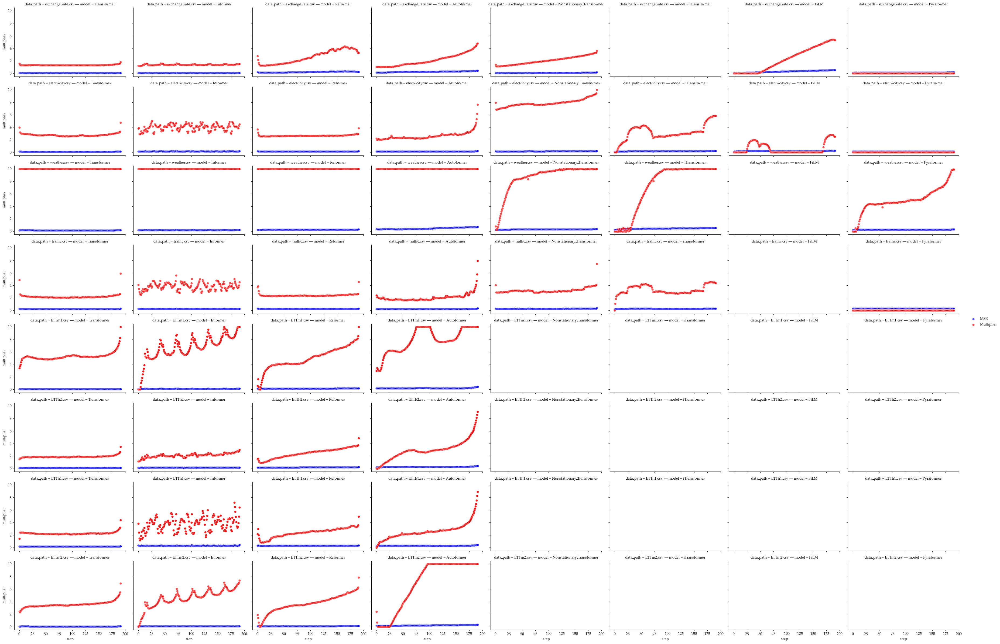

#### **Multipliers vs loss 336 (split=train, constraint_idx=1)**

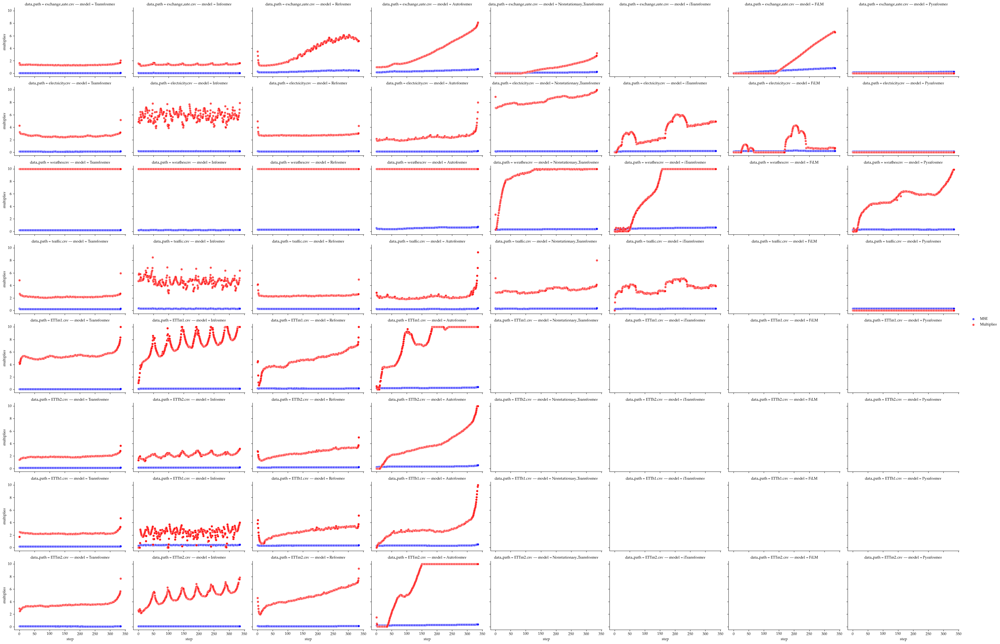

#### **Multipliers vs loss 720 (split=train, constraint_idx=1)**

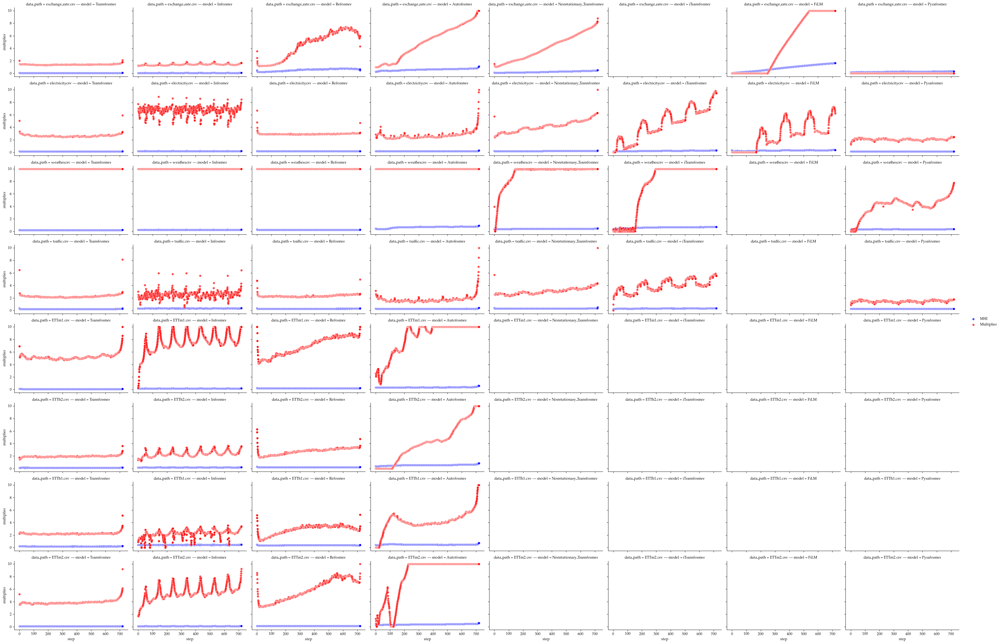

In [149]:
# PARAMS
split="train"
constraint_idx = 1 # use the 50 percentile constraint to plot 1=25,2=50,3=75
seed=2021

# Filter
df_pct50 = df_to_plot_nogs[
    (df_to_plot_nogs.constraint_idx.isin([0,constraint_idx])) 
    & (df_to_plot_nogs.seed==seed) & (df_to_plot_nogs.split==split)
    & (df_to_plot_nogs.constraint_type=="constant")
    ].copy()

PRED_LENS=sorted(df_to_plot_nogs.pred_len.unique().tolist())
#PRED_LENS=[96]
for pred_len in PRED_LENS:
    # Add data for constant line
    df_current_plot = df_pct50.query('pred_len==@pred_len').copy()
    #constraint_level = df_current_plot.constraint_level.unique()[0]
    #df_current_plot['constraint_level'] = constraint_level
    display(Markdown(f"#### **Multipliers vs loss {pred_len} (split={split}, constraint_idx={constraint_idx})**"))

    g = sns.FacetGrid(df_current_plot, col='model', row='data_path', height=3, aspect=1.5, legend_out=True)
    # Plot multipliers and MSEs
    g.map(sns.scatterplot, "step", "mse", alpha=.7,color='blue',label='MSE')
    g.map(sns.scatterplot, "step", "multiplier", alpha=.7,color='red',label='Multiplier')
    # Add legend the series

    g.add_legend()
    #g.savefig(f"{FIGURES_FOLDER}/constrained_vs_erm_{pred_len}_{str(constraint_level).replace('.','')}.png")
    plt.show()

### Does shape prevail when extending window length

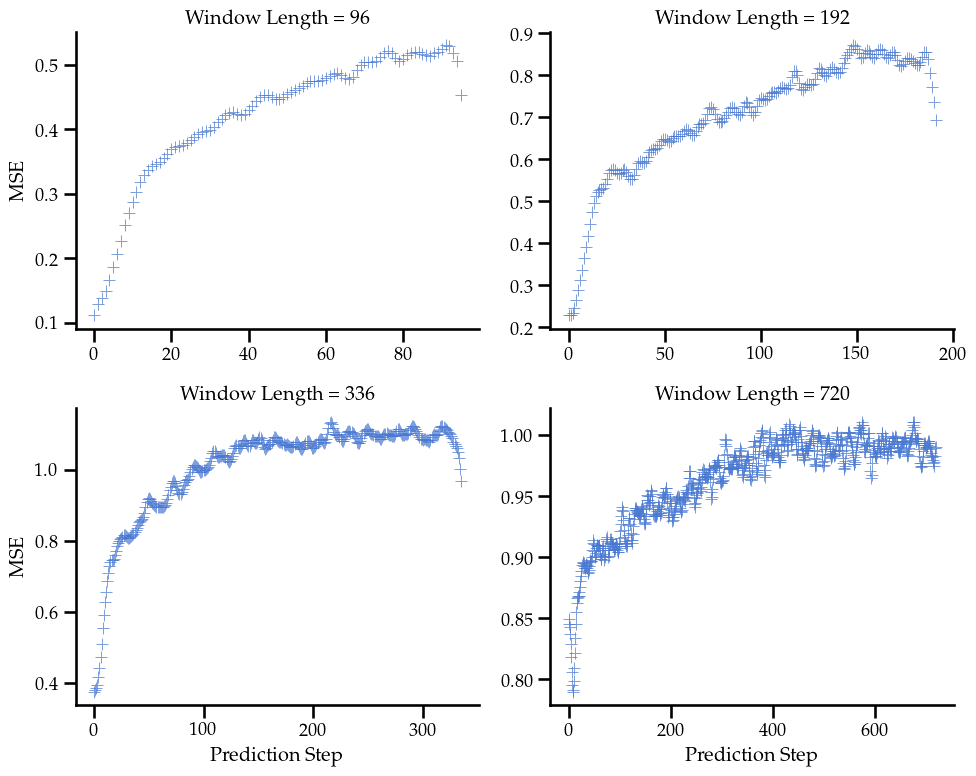

In [197]:
model="Reformer"
data_path="weather.csv"
pred_len=720
split='test'

#seaborn params
plt.rcParams['lines.linewidth'] = 1.8
sns.set_context("talk", font_scale=0.8)
backup = plt.rcParams
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "font.serif": ["Palatino"],
})
#sns.set_palette(sns.cubehelix_palette())
#sns.set_palette("tab10")
sns.set_palette("muted")
#sns.set_palette("Greys")

# Filter data
#to_plot = df_to_plot.query('model==@model & data_path==@data_path & split==@split & constraint_type=="erm"').copy()
# for model in df_to_plot.model.unique():
#     for data_path in df_to_plot.data_path.unique():
#         #for pred_len in df_to_plot.pred_len.unique():
#         to_plot = df_to_plot.query('model==@model & data_path==@data_path & split==@split & constraint_type=="erm"').copy()
#         #to_plot.loc[to_plot.constraint_level==-1.0,'constraint_level'] = to_plot.constraint_level.max()

#         to_plot.rename(columns={'mse':'MSE','step': "Prediction Step","pred_len":"Window Length"},inplace=True)
#         #display(to_plot.constraint_level)
#         # g = sns.scatterplot(data=to_plot,
#         #                     x="Prediction Step",
#         #                     y= "MSE",
#         #                     alpha=.7,hue='constraint_type',style='constraint_type',
#         #                     #palette={'ERM':'blue','Constrained':'red'},
#         #                     legend='full'
#         #                     )
#         display(Markdown(f"# {model} on {data_path} (pred_len={pred_len}, split={split})"))
#         g=sns.FacetGrid(to_plot, col="Window Length", col_wrap=2, height=4, aspect=1.5,sharex=False,sharey=False).map(sns.scatterplot, "Prediction Step", "MSE", alpha=.7)
#         g.map(sns.scatterplot, "Prediction Step", "MSE", alpha=.7)
#         #g.set_title(f"{model} on {data_path} (pred_len={pred_len}, split={split})")
#         plt.figure(figsize=(3.5, 2.6))
#         plt.show()
to_plot = df_to_plot.query('model==@model & data_path==@data_path & split==@split & type=="ERM"').copy()
#display(to_plot.run_id.nunique())
#to_plot.loc[to_plot.constraint_level==-1.0,'constraint_level'] = to_plot.constraint_level.max()

# to_plot.rename(columns={'mse':'MSE','step': "Prediction Step","pred_len":"Window Length"},inplace=True)
#display(to_plot.constraint_level)
# g = sns.scatterplot(data=to_plot,
#                     x="Prediction Step",
#                     y= "MSE",
#                     alpha=.9,hue='Window Length',style='Window Length',
#                     #palette={'ERM':'blue','Constrained':'red'},
#                     legend='full'
#                     )
#g.set_title(f"{model} on {data_path} (pred_len={pred_len}, split={split})")
#g.set_title("")
#plt.figure(figsize=(3.5, 2.6))  # Width, height in inches (standard on papers according to chatGPT)

#plt.savefig(f'../figures/icml/shape_across_lengths_{model}_{data_path[:4]}.pdf', bbox_inches='tight')  # For a PGF file

# Another option
to_plot.rename(columns={'mse':'MSE','step': "Prediction Step","pred_len":"Window Length"},inplace=True)
g=sns.FacetGrid(to_plot, 
                col="Window Length", 
                col_wrap=2, 
                height=4, 
                aspect=1.25,
                sharex=False,
                sharey=False
                )
g.map(sns.scatterplot, "Prediction Step", "MSE", alpha=.7,marker='+')
plt.savefig(f'../figures/icml/shape_across_lengths_{model}_{data_path[:4]}.pdf', bbox_inches='tight')
# g = sns.scatterplot(data=to_plot,
#                     x="Prediction Step",
#                     y= "MSE", 
#                     alpha=.7,hue='Window Length',style='Window Length',
#                     #palette={'ERM':'blue','Constrained':'red'},
#                     legend='full')

plt.rcParams.update(backup)
#g2 = sns.lineplot(data=to_plot.query("constraint_type=='constant'"),x="Prediction Step",y= "constraint_level", alpha=.7,color='green',label='Constraint Level')

### Is train correlated with test?

<AxesSubplot:xlabel='mse_train', ylabel='mse_test'>

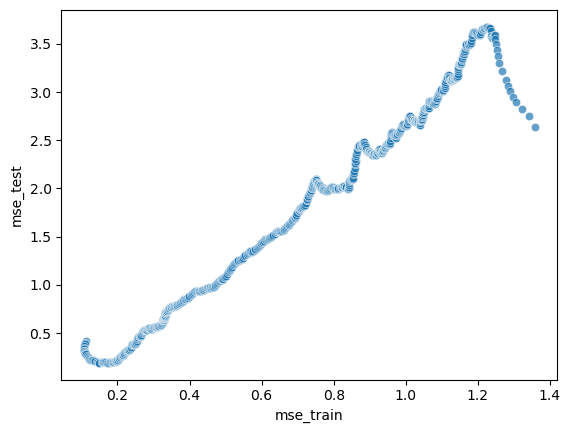

In [ ]:
model="Autoformer"
data_path="exchange_rate.csv"
pred_len=720

dd=df_to_plot.query('model==@model & data_path==@data_path & type=="ERM" & pred_len==@pred_len')
# Create a dataset of mse train and mse test for each step with dd using melt
dd_train = dd.query('split=="train"').copy()
dd_test = dd.query('split=="test"').copy()

dd_plot=dd_train.merge(dd_test,on="step",suffixes=('_train','_test'))[['step','mse_train','mse_test']]
#dd2['diff'] = dd2.test-dd2.train

sns.scatterplot(dd_plot, x="mse_train", y="mse_test", alpha=.7,)

### PAPER: Singular ERM vs Constrained 
Of ERM vs constrained

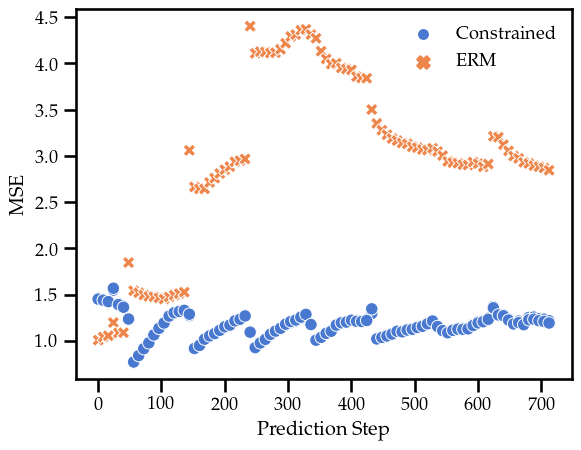

In [ ]:
# #Option 1
# model="Autoformer"
# data_path="exchange_rate.csv"
# pred_len=336
# split='test'

# # Option 2
# model="Transformer"
# data_path="exchange_rate.csv"
# pred_len=720
# split='test'

# # Option 3
model="Informer"
data_path="exchange_rate.csv"
pred_len=720
split='test'

# # Option 4
# model="Autoformer"
# data_path="weather.csv"
# pred_len=96
# split='test'

#seaborn params
plt.rcParams['lines.linewidth'] = 1.8
#sns.set_context("talk", font_scale=0.8)
backup = plt.rcParams
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "font.serif": ["Palatino"],
})

#sns.set_palette(sns.cubehelix_palette())
#sns.set_palette("tab10")
sns.set_palette("muted")
#sns.set_palette("Greys")

# Filter data
to_plot = df_to_plot.query('model==@model & data_path==@data_path & pred_len==@pred_len & split==@split').copy()
to_plot.loc[to_plot.constraint_level==-1.0,'constraint_level'] = to_plot.constraint_level.max()

#Sample every other datapoint
to_plot = to_plot[to_plot.step%8==0]

to_plot.rename(columns={'mse':'MSE','step': "Prediction Step"},inplace=True)
#display(to_plot.constraint_level)
g = sns.scatterplot(data=to_plot,
                    x="Prediction Step",
                    y= "MSE", 
                    hue='type',
                    style='type',
                    #marker='+',
                    #palette={'ERM':'blue','Constrained':'red'},
                    legend='full'
                    )
#g.set_title(f"{model} on {data_path} (pred_len={pred_len}, split={split})")
#plt.figure(figsize=(3.5, 2.6))  # Width, height in inches (standard on papers according to chatGPT)

# remove borders from legend
g.get_legend().get_frame().set_linewidth(0.0)
g.get_legend().set_title("")

# Set the size of the markers
g.legend_.legendHandles[0]._sizes = [40]

# make legend marker a + instead of a dot using handlers manually
#g.legend(handles=g.legend_.legendHandles, labels=["ERM", "Constrained"], title="Type", loc="upper left")



#g.set_xlabels("")
#g.set_ylabels("")
#g.set_titles(col_template="{col_name}")
#g.fig.supxlabel("Prediction Step")
#g.fig.supylabel("MSE")
# for ax in g.axes.flat:
#     ax.set_title("", fontsize='large')
#     ax.set_xlabel(ax.get_xlabel(), fontsize='large')
#     ax.set_ylabel(ax.get_ylabel(), fontsize='large')

# make markers bigger
# for ax in g.axes.flat:
#     for p in ax.patches:
#         p.set( markersize=20)
# disable legend
#g._legend.remove()
# tight layout
#g.tight_layout()
#g.savefig(f"../figures/icml/{figname}.pdf")


plt.savefig(f'../figures/icml/erm_vs_constrained_fp_{model}_{data_path[:4]}_{pred_len}.pdf', bbox_inches='tight')  # For a PGF file
#plt.show()
plt.rcParams.update(backup)
#g2 = sns.lineplot(data=to_plot.query("constraint_type=='constant'"),x="Prediction Step",y= "constraint_level", alpha=.7,color='green',label='Constraint Level')

### PAPER: ERM vs Constrained across models on two datasets

Saved to ../figures/icml/constrained_vs_erm_allmodels_exch_720.pdf
Saved to ../figures/icml/constrained_vs_erm_allmodels_weather_96.pdf


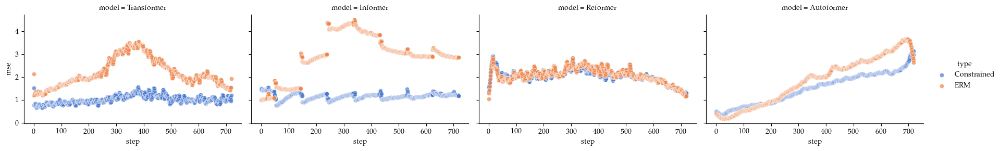

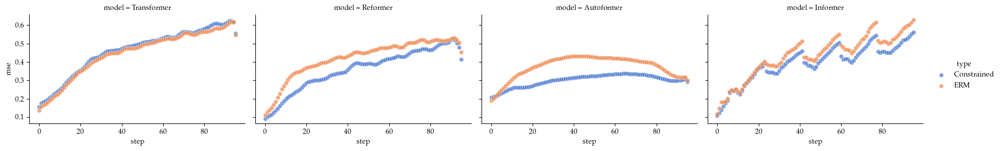

In [ ]:
df_set1 = df_to_plot.query('data_path=="exchange_rate.csv" and pred_len==720 and split=="test"').copy()
df_set2 = df_to_plot.query('data_path=="weather.csv" and pred_len==96 and split=="test"').copy()

#Params for latex
backup = plt.rcParams
sns.set_palette("muted")
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "font.serif": ["Palatino"],
}
)

#plot 1
g=sns.FacetGrid(df_set1, col='model', hue='type', height=3, aspect=1.5, legend_out=True)
g.map(sns.scatterplot, "step", "mse", alpha=.7,legend='full')
g.add_legend()
#TODO fix and uncomment
figure1_dir = f"{FIGURES_FOLDER}/constrained_vs_erm_allmodels_exch_720.pdf"
print(f"Saved to {figure1_dir}")
g.savefig(figure1_dir)

#plot 2
g=sns.FacetGrid(df_set2, col='model', hue='type', height=3, aspect=1.5, legend_out=True)
g.map(sns.scatterplot, "step", "mse", alpha=.7)
g.add_legend()
#TODO fix and uncomment
figure1_dir = f"{FIGURES_FOLDER}/constrained_vs_erm_allmodels_weather_96.pdf"
print(f"Saved to {figure1_dir}")
g.savefig(figure1_dir)

#restoring parameters
plt.rcParams.update(backup)

### (old) ERM vs constrained

[3 2 1 0]


### Dataset: electricity.csv pred_len: 96 constraint_idx: 3

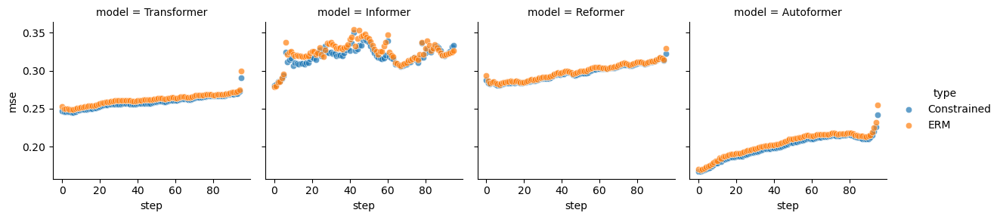

### Dataset: electricity.csv pred_len: 96 constraint_idx: 2

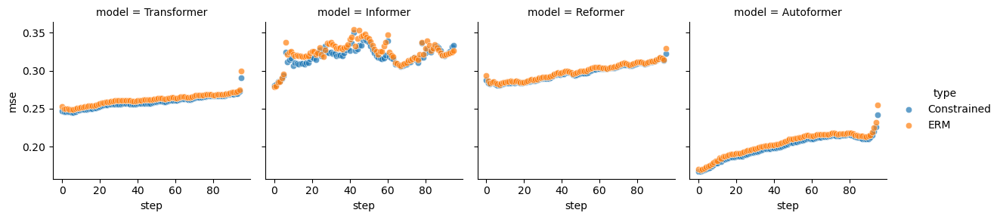

### Dataset: electricity.csv pred_len: 96 constraint_idx: 1

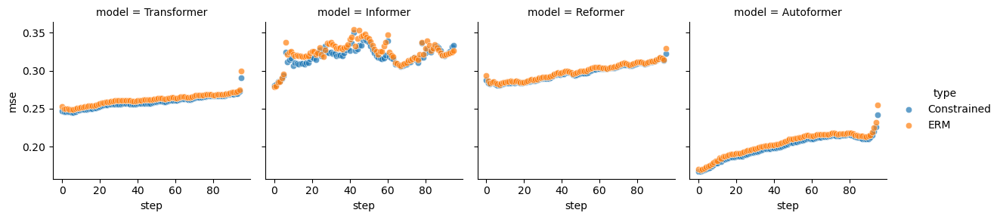

### Dataset: electricity.csv pred_len: 96 constraint_idx: 0

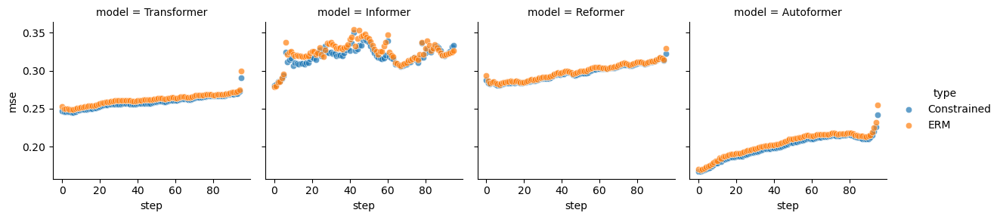

[5 6 2 1 0]


### Dataset: electricity.csv pred_len: 192 constraint_idx: 5

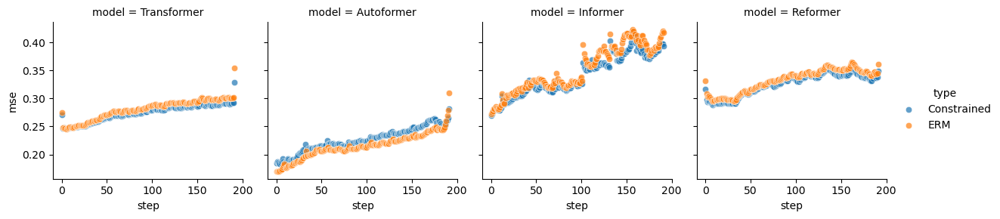

### Dataset: electricity.csv pred_len: 192 constraint_idx: 6

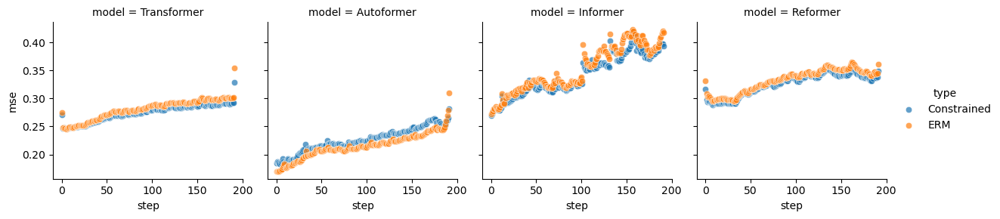

### Dataset: electricity.csv pred_len: 192 constraint_idx: 2

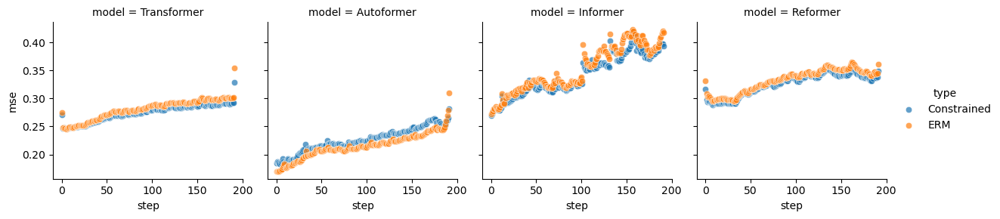

### Dataset: electricity.csv pred_len: 192 constraint_idx: 1

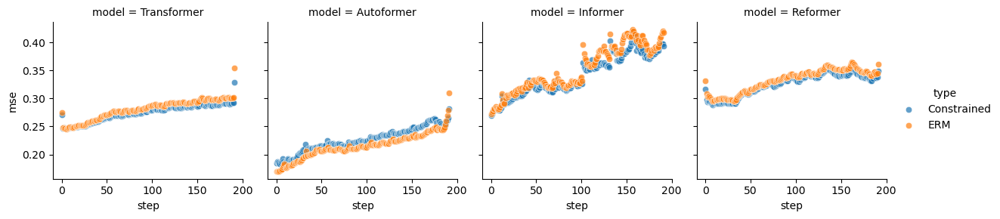

### Dataset: electricity.csv pred_len: 192 constraint_idx: 0

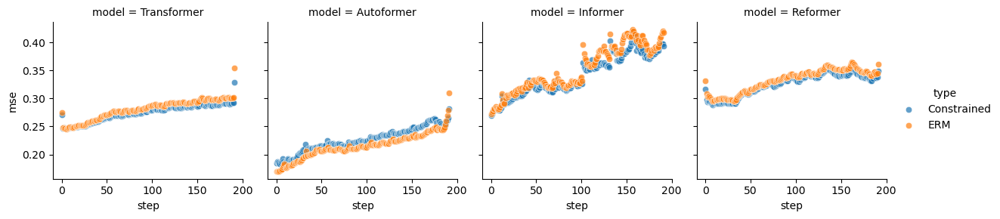

[5 2 3 0]


### Dataset: electricity.csv pred_len: 336 constraint_idx: 5

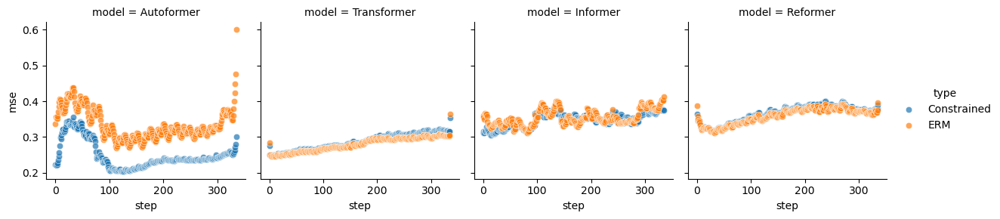

### Dataset: electricity.csv pred_len: 336 constraint_idx: 2

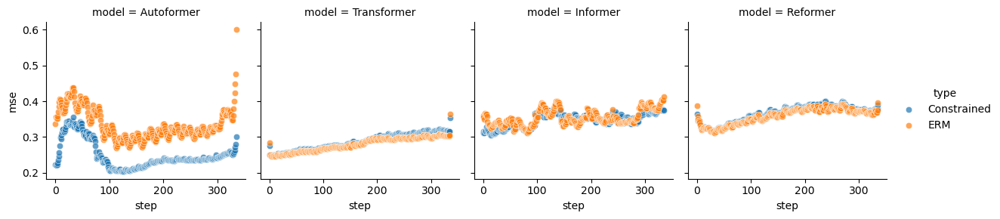

### Dataset: electricity.csv pred_len: 336 constraint_idx: 3

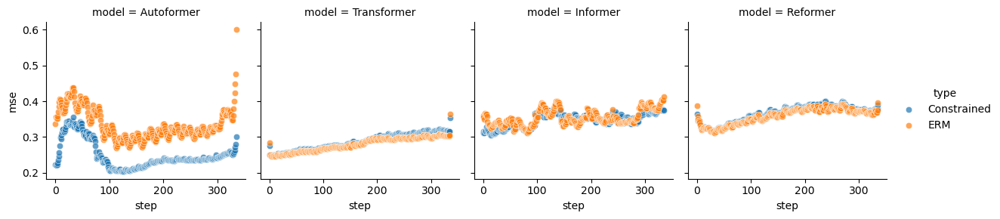

### Dataset: electricity.csv pred_len: 336 constraint_idx: 0

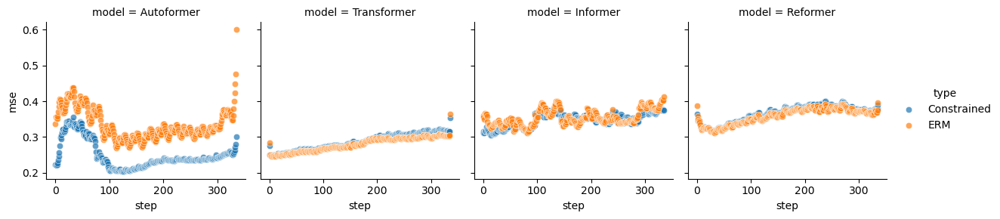

[2 3 0]


### Dataset: electricity.csv pred_len: 720 constraint_idx: 2

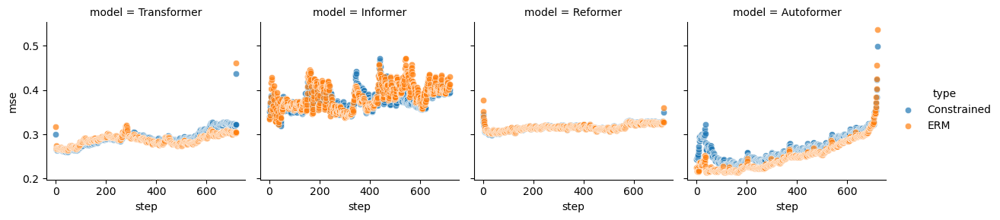

### Dataset: electricity.csv pred_len: 720 constraint_idx: 3

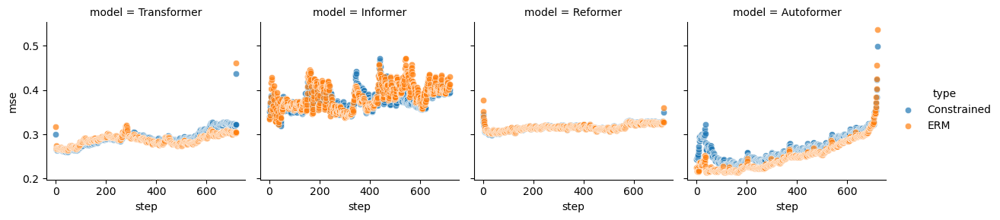

### Dataset: electricity.csv pred_len: 720 constraint_idx: 0

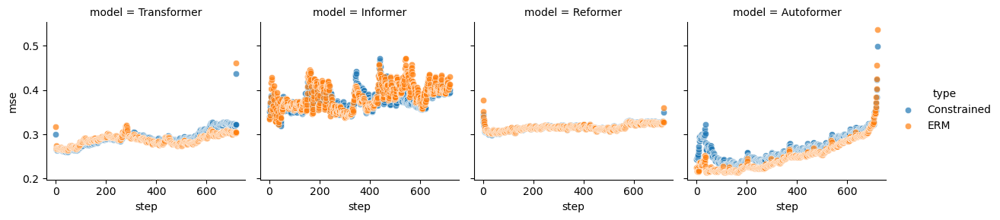

[6 2 4 0]


### Dataset: exchange_rate.csv pred_len: 96 constraint_idx: 6

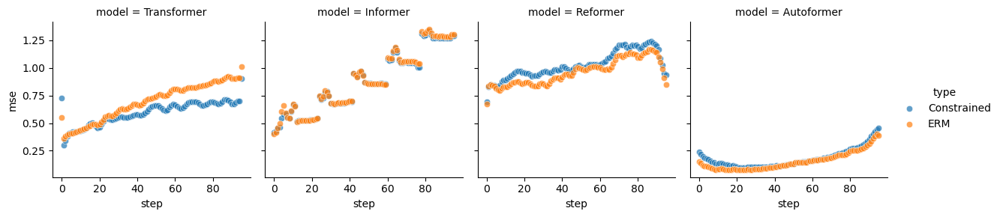

### Dataset: exchange_rate.csv pred_len: 96 constraint_idx: 2

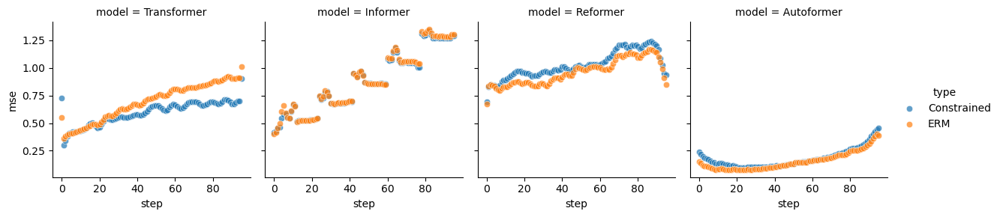

### Dataset: exchange_rate.csv pred_len: 96 constraint_idx: 4

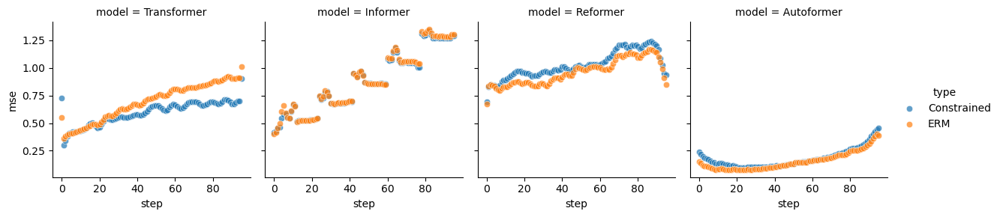

### Dataset: exchange_rate.csv pred_len: 96 constraint_idx: 0

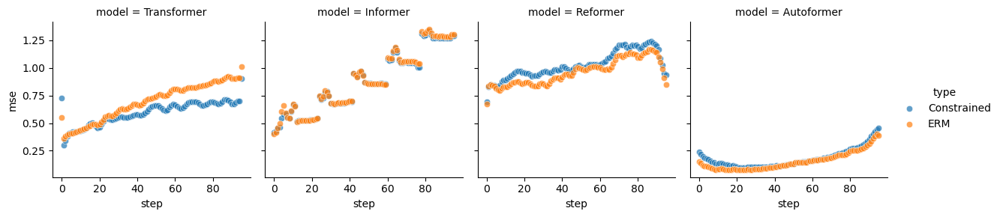

[6 3 2 0]


### Dataset: exchange_rate.csv pred_len: 192 constraint_idx: 6

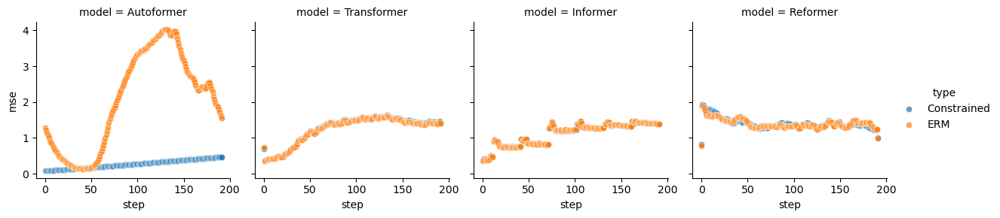

### Dataset: exchange_rate.csv pred_len: 192 constraint_idx: 3

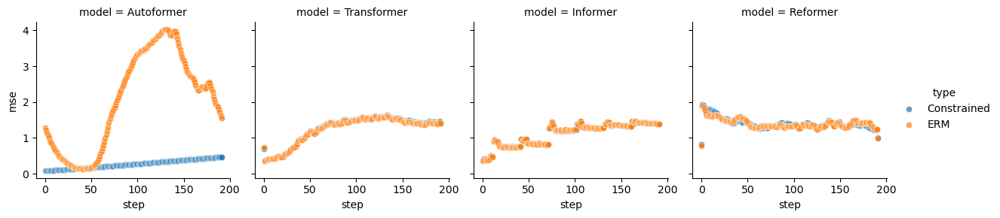

### Dataset: exchange_rate.csv pred_len: 192 constraint_idx: 2

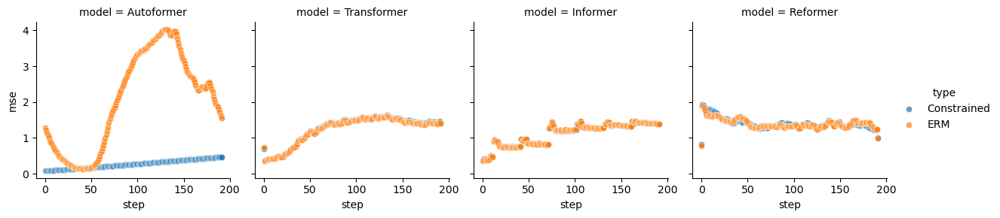

### Dataset: exchange_rate.csv pred_len: 192 constraint_idx: 0

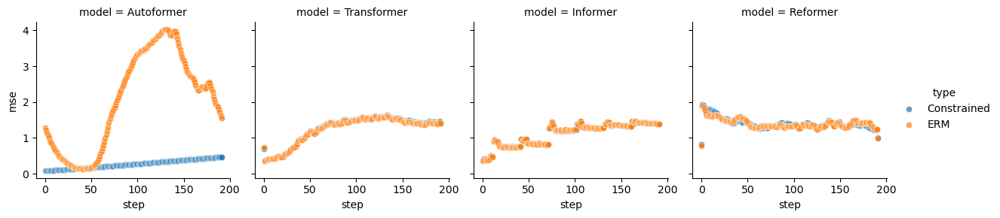

[6 2 1 0]


### Dataset: exchange_rate.csv pred_len: 336 constraint_idx: 6

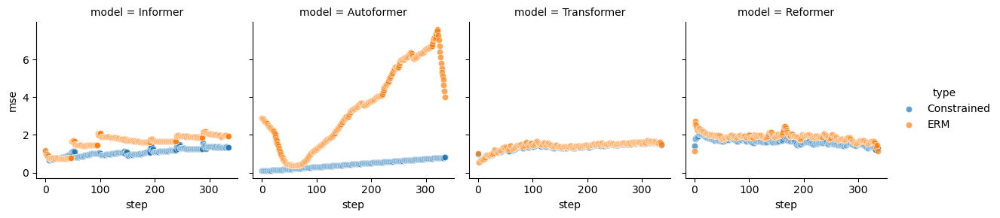

### Dataset: exchange_rate.csv pred_len: 336 constraint_idx: 2

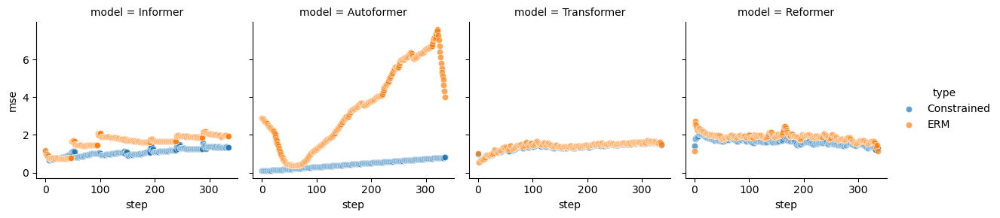

### Dataset: exchange_rate.csv pred_len: 336 constraint_idx: 1

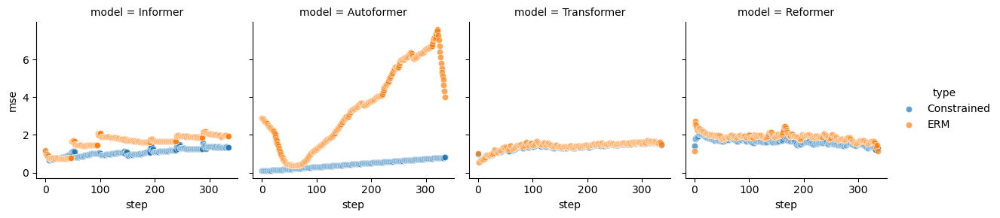

### Dataset: exchange_rate.csv pred_len: 336 constraint_idx: 0

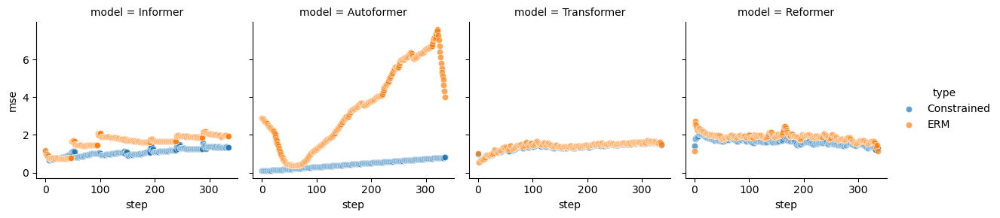

[5 2 3 0]


### Dataset: exchange_rate.csv pred_len: 720 constraint_idx: 5

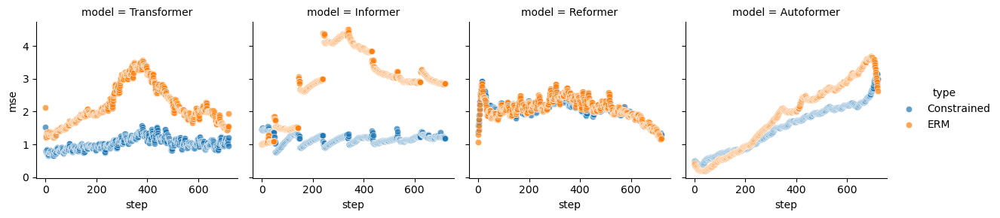

### Dataset: exchange_rate.csv pred_len: 720 constraint_idx: 2

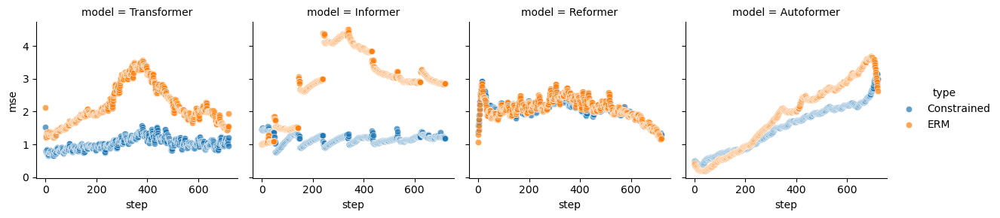

### Dataset: exchange_rate.csv pred_len: 720 constraint_idx: 3

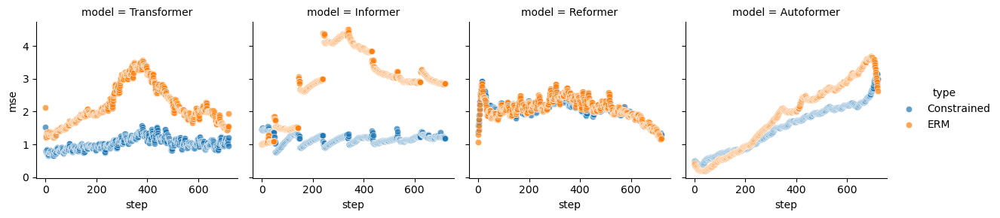

### Dataset: exchange_rate.csv pred_len: 720 constraint_idx: 0

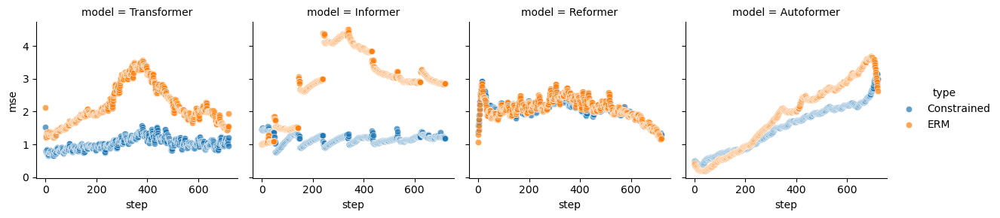

[4 6 1 0]


### Dataset: weather.csv pred_len: 96 constraint_idx: 4

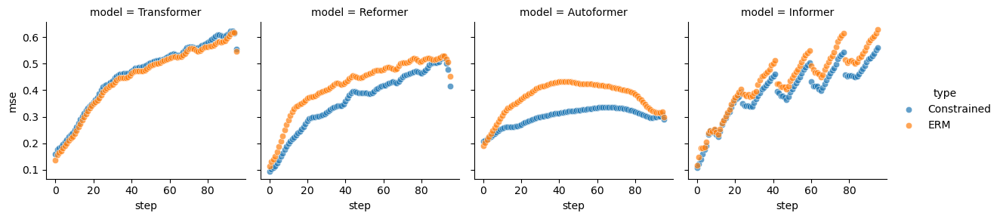

### Dataset: weather.csv pred_len: 96 constraint_idx: 6

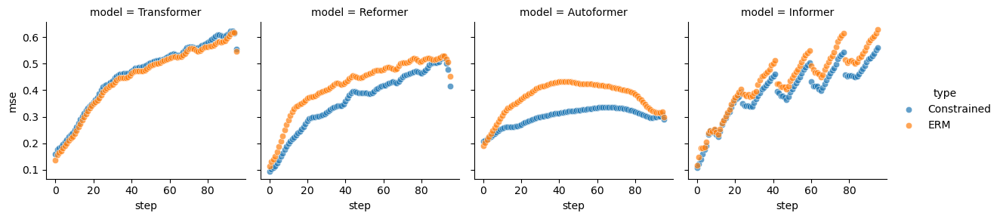

### Dataset: weather.csv pred_len: 96 constraint_idx: 1

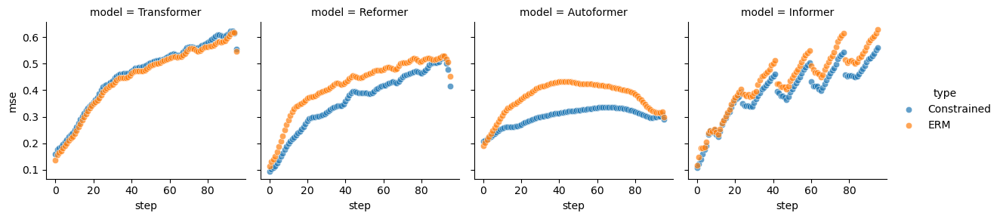

### Dataset: weather.csv pred_len: 96 constraint_idx: 0

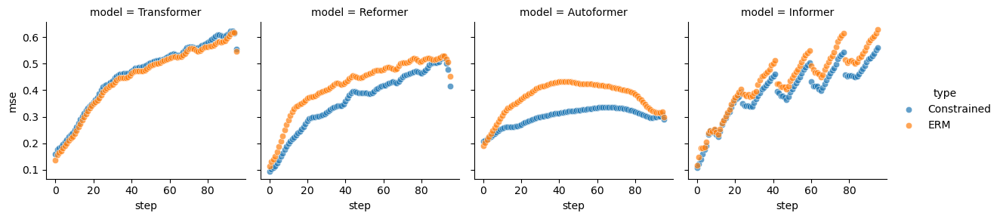

[5 4 2 1 0]


### Dataset: weather.csv pred_len: 192 constraint_idx: 5

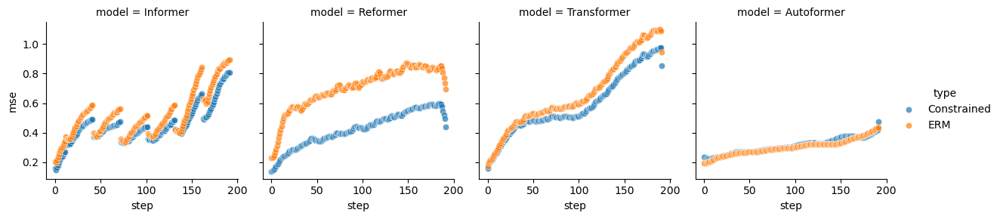

### Dataset: weather.csv pred_len: 192 constraint_idx: 4

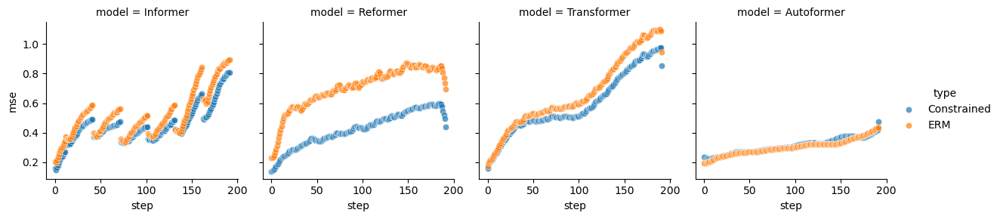

### Dataset: weather.csv pred_len: 192 constraint_idx: 2

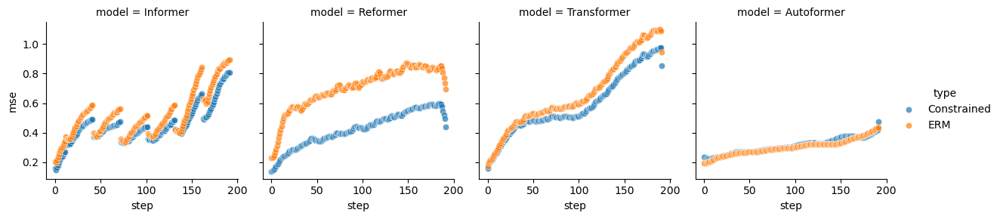

### Dataset: weather.csv pred_len: 192 constraint_idx: 1

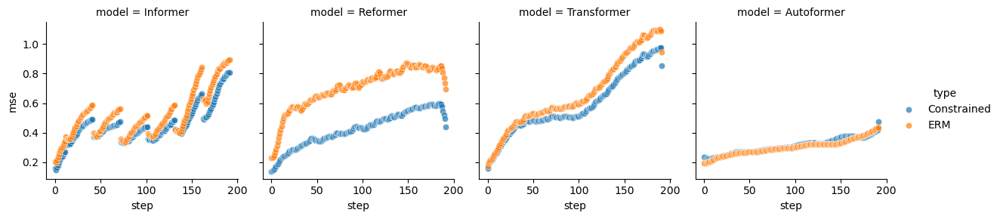

### Dataset: weather.csv pred_len: 192 constraint_idx: 0

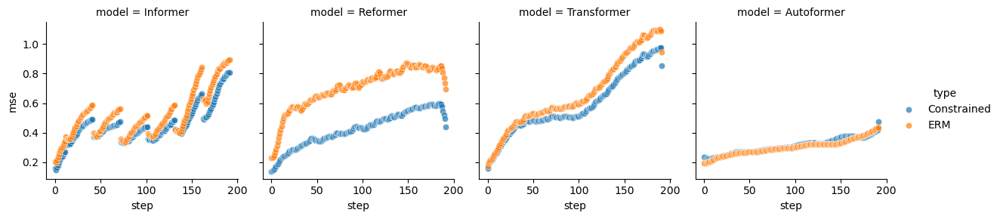

[5 4 3 1 0]


### Dataset: weather.csv pred_len: 336 constraint_idx: 5

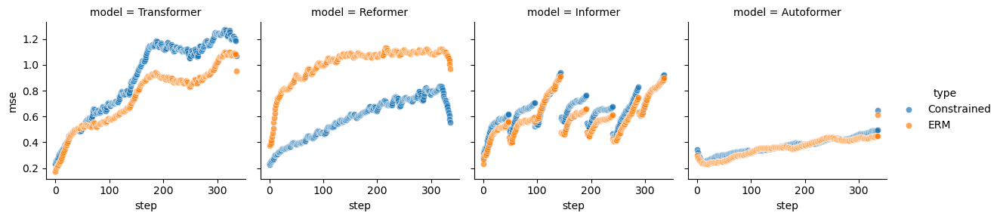

### Dataset: weather.csv pred_len: 336 constraint_idx: 4

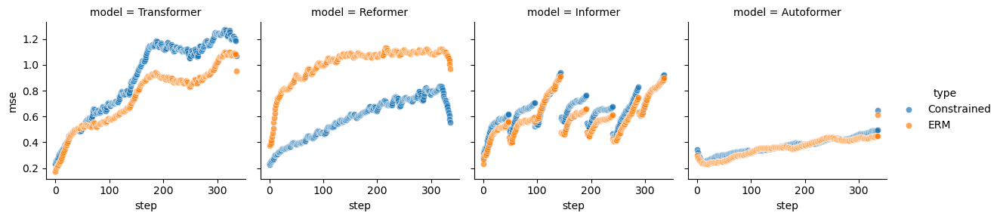

### Dataset: weather.csv pred_len: 336 constraint_idx: 3

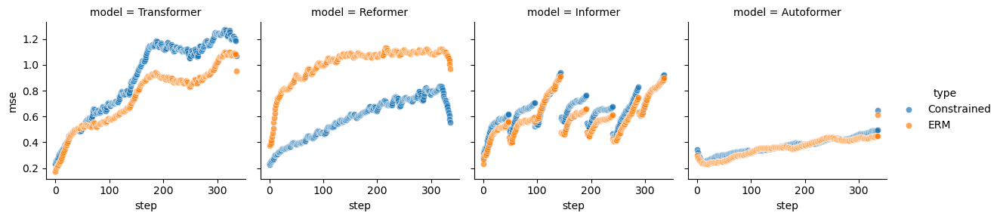

### Dataset: weather.csv pred_len: 336 constraint_idx: 1

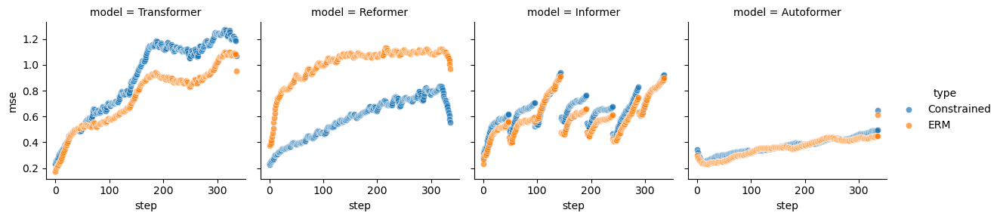

### Dataset: weather.csv pred_len: 336 constraint_idx: 0

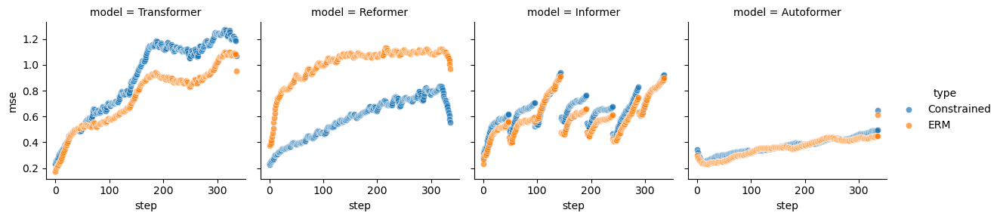

[3 2 1 0]


### Dataset: weather.csv pred_len: 720 constraint_idx: 3

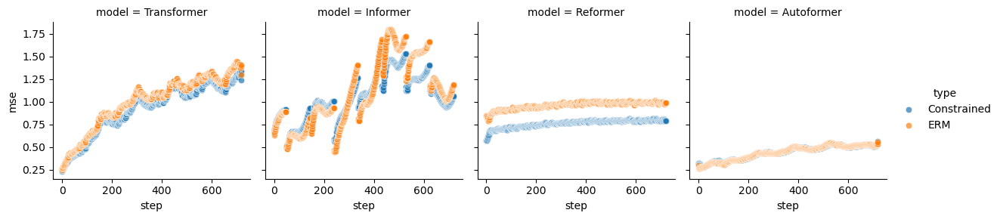

### Dataset: weather.csv pred_len: 720 constraint_idx: 2

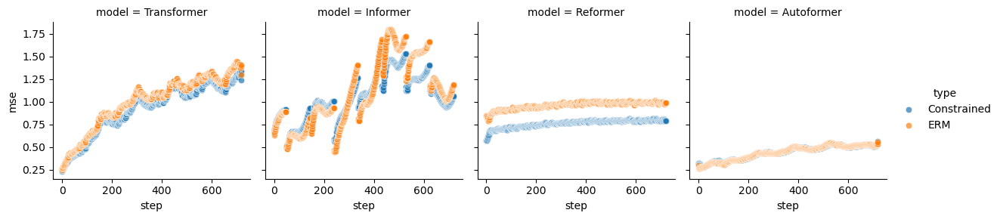

### Dataset: weather.csv pred_len: 720 constraint_idx: 1

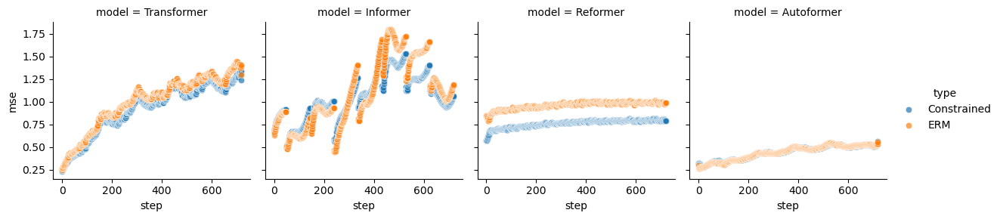

### Dataset: weather.csv pred_len: 720 constraint_idx: 0

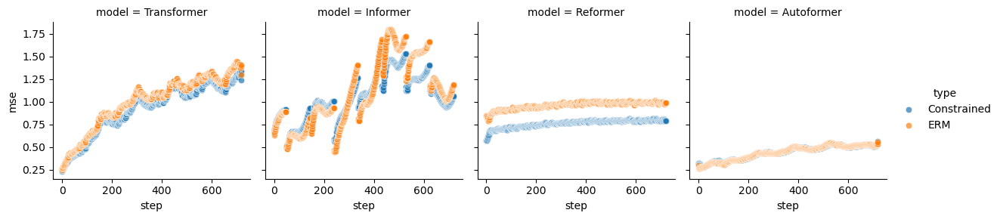

In [ ]:
from IPython.display import display, Markdown
to_plot = df_to_plot[(df_to_plot.split=='test')].copy()
for (data_path,pred_len), series in to_plot.groupby(['data_path',"pred_len"]):
    constraints = series.constraint_idx.unique()
    print(constraints)
    constraints = constraints[constraints!=-1] # to iterate over all constraints explored.
    for constraint_idx in constraints:
        display(Markdown(f"### Dataset: {data_path} pred_len: {pred_len} constraint_idx: {constraint_idx}"))
        plot_series = series#series[series["constraint_idx"]==constraint_idx]
        
        #means_per_experiment = plot_series.groupby(['pred_len','constraint_level','Algorithm','model','epoch','type'])['mse'].mean().reset_index()
        #display(means_per_experiment)
        # do a pivot where model are the rows, and the columns constrained and unconstrained
        #display(means_per_experiment.pivot(index=['model'], columns='type', values='mse').reset_index())

        # sns.scatterplot(x="step", y="mse", hue="Algorithm",style="split", data=plot_series)
        
        # plt.axhline(y=constraint_level, color='r', linestyle='-')
        # plt.title(f"Pred Length: {pred_len}, Constraint_level: {constraint_level}")
        # plt.show()

        # This same scatterplot but in a grid by algorithm. 
        g = sns.FacetGrid(plot_series, col="model", hue="type")
        g.map(sns.scatterplot, "step", "mse", alpha=.7)
        g.add_legend()
        # add the hline
        # for ax in g.axes:
        #     ax.axhline(y=constraint_level, color='r', linestyle='-')
        plt.show()
        # export this plot to latex. Remove the dot in constraint_level decimal
        #TODO fix
        #g.savefig(f"{FIGURES_FOLDER}/constrained_vs_erm_{data_path.replace('.','')}_{pred_len}_{str(constraint_level).replace('.','')}.png")
        # Fix [Errno 2] No such file or directory: 'figures/electricity.csv_96_0.17_individual.png'


### ERM on multiple algorithms
As a front page chart to illustrate the problem

In [ ]:
#TODO ( I think Nacho already did this)

### Loss shaping single instance qualitative analysis

### Plotting dual variables

In [ ]:
df_to_plot[['run_id','pred_len','constraint_level','data_path','model','type']].drop_duplicates().query("data_path=='weather.csv' and model=='Reformer' and type=='Constrained'")

,run_id,pred_len,constraint_level,data_path,model,type
131904,ja5qqrwj,336,0.730,weather.csv,Reformer,Constrained
134064,dv2s5qjf,192,0.598,weather.csv,Reformer,Constrained
134928,dpn9jz5a,96,0.527,weather.csv,Reformer,Constrained
258768,dthgwiaz,720,0.283,weather.csv,Reformer,Constrained


In [ ]:
# #df_to_plot.query('split=="train" and pred_len==96').run_id.head(1)
# #mult_cols = [f"multiplier/{i}" for i in range(0,96)]
# # Plot for every constraint level in the 96 pred len window
# #for pred_len in df_to_plot.pred_len.unique():
# display(Markdown(f"# Multipliers for window of {pred_len}"))
# # sns.scatterplot(x="step", y="multiplier", hue="model",style="constraint_level", 
# #     data=df_to_plot.query(f"split=='train' and type=='Constrained' and pred_len=={96} and data_path=='weather.csv'"))
# # same plot, but grid with one plot per model
# dd = df_to_plot#df_to_plot.query("run_id=='6fgam2dx' and split=='train'")#.query(f"split=='train' and type=='Constrained' and pred_len==96 and data_path=='electricity.csv' and model=='Reformer' and constraint_level==0.157")
# dd_test = df_to_plot#df_to_plot.query("run_id=='6fgam2dx' and split=='test'")#.query(f"split=='test' and type=='Constrained' and pred_len==96 and data_path=='electricity.csv' and model=='Reformer' and constraint_level==0.157")

# #print(dd_test.constraint_level.unique())
# test_set_plus_multipliers = dd[['step','multiplier']].merge(dd_test[['step','split','mse']],on='step')

# unioned = pd.concat([dd[['step','split','multiplier','mse']],test_set_plus_multipliers[['step','split','multiplier','mse']]])

# display(unioned)


# display(test_set_plus_multipliers)

# #constraint_level==0.553
# # mult on x, mse@train and mse@test on y. hue=split
# # Add step over every point
# sns.scatterplot(unioned,x="multiplier", y="mse",hue='split', alpha=.3,legend='full')



# g = sns.FacetGrid(dd, col="model", row="constraint_level")
# g.map(sns.scatterplot, "step", "multiplier", alpha=.3)
# #g.map(sns.scatterplot, "step", "mse", alpha=.3)

# Multipliers for window of 720

,step,split,multiplier,mse
16128,0,train,2.801533,0.209369
16129,1,train,1.050123,0.204042
16130,2,train,0.269966,0.194581
16131,3,train,0.000000,0.189056
16132,4,train,0.000000,0.187635
...,...,...,...,...
17418235,719,test,NaN,1.910884
17418236,719,test,NaN,1.910884
17418237,719,val,NaN,1.909591
17418238,719,val,NaN,1.909591


,step,multiplier,split,mse
0,0,2.801533,train,0.209369
1,0,2.801533,test,0.268508
2,0,2.801533,val,0.266284
3,0,2.801533,train,0.215619
4,0,2.801533,test,0.247226
...,...,...,...,...
17418235,719,NaN,test,1.910884
17418236,719,NaN,test,1.910884
17418237,719,NaN,val,1.909591
17418238,719,NaN,val,1.909591


Error in callback <function install_repl_displayhook.<locals>.post_execute at 0x7fedbc19fa70> (for post_execute):


KeyboardInterrupt: 

/home/jporras/miniconda3/envs/autoformer/lib/python3.7/site-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


Error in callback <function flush_figures at 0x7fedbc19f4d0> (for post_execute):


KeyboardInterrupt: 

### More random explorations
Ideas: 
1. Loss over time
2. Infeasibility rate over time
3. Loss shape across epochs (see how it evolves)
4. Plotting dual variables

## Result tables
1. Reproduce the pivot table from notebook 11, perhaps add standard deviation reports.
2. Explore and find other interesting table visualziation

### Pivot tables (summary)

864


(864, 5)

In [234]:
base_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 672 entries, 384 to 1316
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   data_path             672 non-null    object 
 1   model                 672 non-null    object 
 2   pred_len              672 non-null    int64  
 3   type                  672 non-null    object 
 4   constraint_type       672 non-null    object 
 5   split                 672 non-null    object 
 6   Algorithm             672 non-null    object 
 7   constraint_idx        672 non-null    float64
 8   constraint_level      672 non-null    float64
 9   mse                   672 non-null    float64
 10  mae                   240 non-null    float64
 11  rmse                  240 non-null    float64
 12  linearity             240 non-null    float64
 13  window_std            672 non-null    float64
 14  std_mse               24 non-null     float64
 15  mcv                 

,model,pred_len,constraint_type,split,data_path,type,Algorithm,constraint_idx,constraint_level,mse,mae,rmse,linearity,window_std,std_mse,mcv,std_mcv,mean_infeasible_rate,std_infeasible_rate,run_count
110,FiLM,96,constant,test,weather.csv,NaN,NaN,NaN,NaN,0.0,0.0,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN
113,FiLM,96,constant,train,weather.csv,NaN,NaN,NaN,NaN,0.0,0.0,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN
116,FiLM,96,constant,val,weather.csv,NaN,NaN,NaN,NaN,0.0,0.0,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN
117,FiLM,96,constant_resilience,test,electricity.csv,NaN,NaN,NaN,NaN,0.0,0.0,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN
118,FiLM,96,constant_resilience,test,exchange_rate.csv,NaN,NaN,NaN,NaN,0.0,0.0,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN
119,FiLM,96,constant_resilience,test,weather.csv,NaN,NaN,NaN,NaN,0.0,0.0,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN
120,FiLM,96,constant_resilience,train,electricity.csv,NaN,NaN,NaN,NaN,0.0,0.0,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN
121,FiLM,96,constant_resilience,train,exchange_rate.csv,NaN,NaN,NaN,NaN,0.0,0.0,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN
122,FiLM,96,constant_resilience,train,weather.csv,NaN,NaN,NaN,NaN,0.0,0.0,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN
123,FiLM,96,constant_resilience,val,electricity.csv,NaN,NaN,NaN,NaN,0.0,0.0,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN


In [222]:
#DEBUG
pd.set_option('display.max_rows',None)
summary_metrics[summary_metrics.data_path.isin(['weather.csv','electricity.csv','exchange_rate.csv'])].groupby(['data_path','model','pred_len']).size().sort_values().reset_index()


,data_path,model,pred_len,0
0,weather.csv,iTransformer,720,6
1,weather.csv,Pyraformer,96,6
2,weather.csv,Nonstationary_Transformer,720,6
3,electricity.csv,iTransformer,192,6
4,electricity.csv,iTransformer,336,6
5,electricity.csv,iTransformer,720,6
6,weather.csv,Nonstationary_Transformer,336,6
7,weather.csv,Nonstationary_Transformer,192,6
8,weather.csv,Nonstationary_Transformer,96,6
9,exchange_rate.csv,FiLM,96,6


In [245]:
import itertools
def style_pivot_table_best_per_params(pivoted_df):
    pivoted_df=pivoted_df.copy()
    pivoted_df.columns.names = ['metric','constraint_type','model']
    mask = pd.DataFrame(False, index=pivoted_df.index, columns=pivoted_df.columns)
    for keys,subset in  pivoted_df.groupby(level=['metric','model'],axis=1):
        mask.loc[:,subset.columns] = subset.eq(subset.min(axis=1), axis=0)
        
    ##STYLE
    # truncate to 4 decimals for display
    pivoted_df=pivoted_df.style.format("{:.3f}")
    pivoted_df=pivoted_df.apply(lambda s: ['font-weight: bold;text-decoration: underline' if v else '' for v in mask.loc[s.name]], axis=1)
    return pivoted_df

def data_path_renaming(x):
    if x=="exchange_rate.csv":
        x='Exchange'
    x=x.replace(".csv","")
    if x=="electricity":
        x="ECL"
    else: 
        x=x.replace(".csv","").replace("_"," ").title()
    return latex_scaffolding_dataset(x)
def latex_scaffolding_dataset(x):
    # Add rotatebox
    x=r'\rotatebox'+'{90}{'+x+'}'
    x=r'\multirow{4}{*}{'+x+'}'
    return x
def text_bf(x):
    return r'\textbf{'+str(x)+'}'

def latex_style_best(pivoted_df):
    pivoted_df=pivoted_df.copy()
    pivoted_df.columns.names = ['metric','constraint_type','model']
    mask = pd.DataFrame(False, index=pivoted_df.index, columns=pivoted_df.columns)
    for keys,subset in  pivoted_df.groupby(level=['metric','model'],axis=1):
        mask.loc[:,subset.columns] = subset.eq(subset.min(axis=1), axis=0)
    #if mask is true, add text_bf
    boldface_df = pivoted_df.copy().applymap(lambda x: f"{x:.3f}")
    boldface_df[mask] = boldface_df.applymap(text_bf)
    return boldface_df


pd.set_option('display.max_columns', None)
def compute_pivot_over_metric(summary_metrics,pivot_value_columns=['window_std'],split='test'):
    pivoted_tables=[]
    data_paths=summary_metrics.data_path.unique()
    for data_path in data_paths:
        tp2=summary_metrics.query(f'data_path==@data_path and split==@split').copy()

        #GROUPING TEH VALS
        grouped_values=tp2.groupby(['pred_len','model','constraint_type'])[[
            'mse',
            'mcv',
            'mae',
            'std_mse',
            'std_mcv',
            'mean_infeasible_rate',
            'std_infeasible_rate',
            'window_std'
            ]].mean().reset_index()
        
        # Pivot of models versus constrained and ERM, values are mse and mse_diff
        all_results = grouped_values
        
        # Pivot all results, sort ascending by pred_len, then mean_violation on constrained
        pivoted=all_results.pivot(
            index=['pred_len'],
            columns=['constraint_type','model'], 
            values=pivot_value_columns
        )
        
        pivoted=style_pivot_table_best_per_params(pivoted)
        #display(pivoted)
        pivoted_tables.append(pivoted)
    result_table = pd.concat([d.data for d in pivoted_tables],keys=data_paths,names=['data_path'])

    return result_table
display(Markdown(f"# Pivot tables for split=test"))

#THIS RUNS OLD DATASETS ALL MODELS
summary_metrics_to_plot = summary_metrics[summary_metrics.data_path.isin(['weather.csv','electricity.csv','exchange_rate.csv'])]
# THIS RUNS ALL DATASETS OLD MODELS
#summary_metrics_to_plot = summary_metrics[summary_metrics.model.isin(['Autoformer','Reformer','Informer','Transformer'])]


# rename constraint_types to be more readable
summary_metrics_to_plot['constraint_type'] = summary_metrics_to_plot['constraint_type'].replace({
    'constant':'1Ours',
    'erm':'3ERM',
    'constant_resilience':'2Ours+R'
})

# FILLING BLANKS TO NOT BREKA THE TABLE
base_df=summary_metrics_to_plot
models = base_df.model.unique()
pred_lens = [96, 192, 336, 720]
constraint_type=base_df.constraint_type.unique()
split=base_df.split.unique()
data_paths=base_df.data_path.unique()
# Create a dataframe with all expected keys by crossjoining
keys = ['model','pred_len','constraint_type','split','data_path']
print(len(models)*len(pred_lens)*len(constraint_type)*len(split)*len(data_paths))
df_keys = pd.DataFrame(list(itertools.product(*[models,pred_lens,constraint_type,split,data_paths])),columns=keys)
#df_keys.merge(base_df,how='left',on=keys)['mse']
filler=9999
summary_metrics_to_plot=df_keys.merge(base_df,how='left',on=keys).fillna({'mse':filler,'mae':filler,'rmse':filler,'window_std':filler})

for metric in [
    'mcv',
    #'mse',
    #'mae',#TODO broken for new models
    #'mean_infeasible_rate',
    #'window_std',
    ]:
    result_table = compute_pivot_over_metric(summary_metrics_to_plot,pivot_value_columns=[metric],split='test')
    display(Markdown(f"## {metric}"))
    # add bold
    display(style_pivot_table_best_per_params(result_table))
    #latex styling
    latex_table=result_table.copy()

    latex_table.index=latex_table.index \
        .set_levels([data_path_renaming(level) for level in latex_table.index.levels[0]],level=0)

    
    
    latex_table=latex_style_best(latex_table)
    
    # drop the metric level in the multiindex
    latex_table.columns=latex_table.columns.droplevel(0)

    # Swap the column multiindex to model on top
    latex_table=latex_table.swaplevel(0,1,axis=1)

    #latex_table=style_pivot_table_best_per_params(latex_table)
    # Show only :.4f
    # Rename data_path to None
    latex_table=latex_table.rename_axis(index={'data_path':None,'pred_len':''},columns={'model':'','constraint_type':''})
    #display(latex_table.columns)
    # refactor the multiindex in columns so that repeated models merge
    #print(latex_table.to_latex(escape=False,index_names=False,multicolumn_format='c',multicolumn=True))
    print(latex_table.to_latex(escape=False,multicolumn_format='c',multicolumn=True,column_format='cc|ccc|ccc|ccc|ccc'))
    #to markdown
    print(latex_table.to_markdown(escape=False))
    


# Pivot tables for split=test

864


/home/jporras/miniconda3/envs/autoformer/lib/python3.7/site-packages/ipykernel_launcher.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


## mcv

\begin{tabular}{cc|ccc|ccc|ccc|ccc}
\toprule
                                         &     & \multicolumn{3}{c}{Autoformer} & \multicolumn{3}{c}{FiLM} & \multicolumn{3}{c}{Informer} & \multicolumn{3}{c}{Nonstationary_Transformer} & \multicolumn{3}{c}{Pyraformer} & \multicolumn{3}{c}{Reformer} & \multicolumn{3}{c}{Transformer} & \multicolumn{3}{c}{iTransformer} \\
                                         &     &           1Ours &         2Ours+R &            3ERM &           1Ours & 2Ours+R &   3ERM &           1Ours &         2Ours+R &            3ERM &                     1Ours & 2Ours+R &            3ERM &           1Ours & 2Ours+R &            3ERM &           1Ours &         2Ours+R &            3ERM &           1Ours &         2Ours+R &            3ERM &           1Ours & 2Ours+R &            3ERM \\
{} & {} &                 &                 &                 &                 &         &        &                 &                 &                 &                           &

ImportError: Missing optional dependency 'tabulate'.  Use pip or conda to install tabulate.

In [ ]:
#latex styling
latex_table=result_table.data.copy()

latex_table.index=latex_table.index \
    .set_levels([data_path_renaming(level) for level in latex_table.index.levels[0]],level=0)

#TODO FIX the styling function to add textbf
#latex_table=latex_style_best(latex_table)
# drop the metric level in the multiindex
latex_table.columns=latex_table.columns.droplevel(0)

# Swap the column multiindex to model on top
latex_table=latex_table.swaplevel(0,1,axis=1)

#latex_table=style_pivot_table_best_per_params(latex_table)
# Show only :.4f
latex_table=latex_table.applymap(lambda x: f"{x:.4f}")
# Rename data_path to None
latex_table=latex_table.rename_axis(index={'data_path':None,'pred_len':''},columns={'model':'','type':''})
#display(latex_table.columns)
# refactor the multiindex in columns so that repeated models merge
display(latex_table)
#print(latex_table.to_latex(escape=False,index_names=False,multicolumn_format='c',multicolumn=True))
print(latex_table.to_latex(escape=False,multicolumn_format='c',multicolumn=True))


Autoformer            Informer  \
                                              Constrained     ERM Constrained   
                                                                                
\multirow{4}{*}{\rotatebox{90}{ECL}}      96       0.0872  1.2040      0.1704   
                                          192      0.0260  1.2153      0.1733   
                                          336      0.0422  1.3342      0.1585   
                                          720      0.0933  1.2521      0.1647   
\multirow{4}{*}{\rotatebox{90}{Exchange}} 96       0.0222  1.1546      0.8342   
                                          192      0.0000  3.0520      1.0680   
                                          336      0.0000  4.4415      0.0000   
                                          720      0.7780  2.8524      0.0000   
\multirow{4}{*}{\rotatebox{90}{Weather}}  96       0.0000  1.3749      0.1858   
                                          192      0.0014  1.3027      0.0193   
                                          336      0.0178  1.3586      0.4108   
                                          720      0.0000  1.4425      0.8020   

                                                         Reformer          \
                                                  ERM Constrained     ERM   
                                                                            
\multirow{4}{*}{\rotatebox{90}{ECL}}      96   1.3246      0.1471  1.2989   
                                          192  1.3518      0.1656  1.3323   
                                          336  1.3544      0.1977  1.3594   
                                          720  1.3852      0.1393  1.3161   
\multirow{4}{*}{\rotatebox{90}{Exchange}} 96   1.8800      0.9173  1.9604   
                                          192  2.1129      1.2133  2.3984   
                                          336  2.6333      1.4229  2.9086   
                                          720  3.9612      1.4595  3.0947   
\multirow{4}{*}{\rotatebox{90}{Weather}}  96   1.4353      0.0000  1.4221   
                                          192  1.5147      0.0000  1.7031   
                                          336  1.5995      0.0103  2.0096   
                                          720  2.1004      0.4783  1.9629   

                                              Transformer          
                                              Constrained     ERM  
                                                                   
\multirow{4}{*}{\rotatebox{90}{ECL}}      96       0.1488  1.2622  
                                          192      0.0633  1.2806  
                                          336      0.1570  1.2800  
                                          720      0.1547  1.2885  
\multirow{4}{*}{\rotatebox{90}{Exchange}} 96       0.0081  1.6906  
                                          192      1.2178  2.2355  
                                          336      1.3230  2.4210  
                                          720      0.0000  3.1971  
\multirow{4}{*}{\rotatebox{90}{Weather}}  96       0.0474  1.4480  
                                          192      0.4113  1.6668  
                                          336      0.2090  1.7492  
                                          720      0.7081  2.0022

\begin{tabular}{llllllllll}
\toprule
                                         &     & \multicolumn{2}{c}{Autoformer} & \multicolumn{2}{c}{Informer} & \multicolumn{2}{c}{Reformer} & \multicolumn{2}{c}{Transformer} \\
                                         &     & Constrained &     ERM & Constrained &     ERM & Constrained &     ERM & Constrained &     ERM \\
{} & {} &             &         &             &         &             &         &             &         \\
\midrule
\multirow{4}{*}{\rotatebox{90}{ECL}} & 96  &      0.0872 &  1.2040 &      0.1704 &  1.3246 &      0.1471 &  1.2989 &      0.1488 &  1.2622 \\
                                         & 192 &      0.0260 &  1.2153 &      0.1733 &  1.3518 &      0.1656 &  1.3323 &      0.0633 &  1.2806 \\
                                         & 336 &      0.0422 &  1.3342 &      0.1585 &  1.3544 &      0.1977 &  1.3594 &      0.1570 &  1.2800 \\
                                         & 720 &      0.0933 &  1.2521 &      0.1647 &  

In [ ]:
latex_table = result_table.data.copy()
latex_table.index = latex_table.index.set_levels([r'\rotatebox{90}{' + level.replace(".csv","").replace("_"," ").title() + '}' for level in latex_table.index.levels[0]], level=0)
latex_table.columns = latex_table.columns.set_levels([level.replace("model_", "") for level in latex_table.columns.levels[1]], level=1)

# Show only :.4f
latex_table = latex_table.applymap(lambda x: f"{x:.4f}")
# Rename data_path to None
latex_table = latex_table.rename_axis(index={'data_path': None})
display(latex_table)

metric                                         mse                         \
type                                   Constrained        ERM Constrained   
model                                   Autoformer Autoformer    Informer   
                              pred_len                                      
\rotatebox{90}{Electricity}   96            0.2002     0.2040      0.3194   
                              192           0.2263     0.2154      0.3413   
                              336           0.2491     0.3342      0.3475   
                              720           0.2703     0.2521      0.3767   
\rotatebox{90}{Exchange Rate} 96            0.1788     0.1546      0.8722   
                              192           0.2659     2.0520      1.1100   
                              336           0.4456     3.4415      1.0876   
                              720           1.5097     1.8524      1.1697   
\rotatebox{90}{Weather}       96            0.3001     0.3749      0.3948   
                              192           0.3113     0.3027      0.4474   
                              336           0.3740     0.3586      0.6558   
                              720           0.4416     0.4425      1.0510   

metric                                                                \
type                                        ERM Constrained      ERM   
model                                  Informer    Reformer Reformer   
                              pred_len                                 
\rotatebox{90}{Electricity}   96         0.3246      0.2971   0.2989   
                              192        0.3518      0.3256   0.3323   
                              336        0.3544      0.3647   0.3594   
                              720        0.3852      0.3163   0.3161   
\rotatebox{90}{Exchange Rate} 96         0.8800      1.0253   0.9604   
                              192        1.1129      1.4023   1.3984   
                              336        1.6333      1.6319   1.9086   
                              720        2.9612      2.0625   2.0947   
\rotatebox{90}{Weather}       96         0.4353      0.3609   0.4221   
                              192        0.5147      0.4254   0.7031   
                              336        0.5995      0.5890   1.0096   
                              720        1.1004      0.7613   0.9629   

metric                                                          
type                                   Constrained         ERM  
model                                  Transformer Transformer  
                              pred_len                          
\rotatebox{90}{Electricity}   96            0.2588      0.2622  
                              192           0.2743      0.2806  
                              336           0.2871      0.2801  
                              720           0.2927      0.2885  
\rotatebox{90}{Exchange Rate} 96            0.5927      0.6906  
                              192           1.2528      1.2355  
                              336           1.3620      1.4210  
                              720           1.0286      2.1971  
\rotatebox{90}{Weather}       96            0.4616      0.4480  
                              192           0.5932      0.6668  
                              336           0.9010      0.7492  
                              720           0.9241      1.0022

## Pivot tables (resilience) (TEMP)

In [ ]:
def style_pivot_table_best_per_params(pivoted_df):
    pivoted_df=pivoted_df.copy()
    pivoted_df.columns.names = ['metric','type','model']
    mask = pd.DataFrame(False, index=pivoted_df.index, columns=pivoted_df.columns)
    for keys,subset in  pivoted_df.groupby(level=['metric','model'],axis=1):
        mask.loc[:,subset.columns] = subset.eq(subset.min(axis=1), axis=0)
        
    ##STYLE
    # truncate to 4 decimals for display
    pivoted_df=pivoted_df.style.format("{:.4f}")
    pivoted_df=pivoted_df.apply(lambda s: ['font-weight: bold;text-decoration: underline' if v else '' for v in mask.loc[s.name]], axis=1)
    return pivoted_df

def data_path_renaming(x):
    if x=="exchange_rate.csv":
        x='Exchange'
    x=x.replace(".csv","")
    if x=="electricity":
        x="ECL"
    else: 
        x=x.replace(".csv","").replace("_"," ").title()
    return latex_scaffolding_dataset(x)
def latex_scaffolding_dataset(x):
    # Add rotatebox
    x=r'\rotatebox'+'{90}{'+x+'}'
    x=r'\multirow{4}{*}{'+x+'}'
    return x
def text_bf(x):
    return r'\textbf{'+x+'}'
def latex_style_best(pivoted_df):#TODO broken
    pivoted_df=pivoted_df.copy()
    pivoted_df.columns.names = ['metric','type','model']
    mask = pd.DataFrame(False, index=pivoted_df.index, columns=pivoted_df.columns)
    for keys,subset in  pivoted_df.groupby(level=['metric','model'],axis=1):
        mask.loc[:,subset.columns] = subset.eq(subset.min(axis=1), axis=0)
    #if mask is true, add text_bf
    pivoted_df=pivoted_df.apply(lambda s: [text_bf(v) if v else '' for v in mask.loc[s.name]], axis=1)
    return pivoted_df


pd.set_option('display.max_columns', None)
def compute_pivot_over_metric(summary_metrics,pivot_value_columns=['window_std'],split='test'):
    pivoted_tables=[]
    data_paths=summary_metrics.data_path.unique()
    for data_path in data_paths:
        tp2=summary_metrics.query(f'data_path==@data_path and split==@split').copy()

        #GROUPING TEH VALS
        grouped_values=tp2.groupby(['pred_len','model','type'])[[
            'mse',
            'mcv',
            'std_mse',
            'std_mcv',
            'mean_infeasible_rate',
            'std_infeasible_rate',
            'window_std'
            ]].mean().reset_index()
        
        # Pivot of models versus constrained and ERM, values are mse and mse_diff
        all_results = grouped_values
        
        # Pivot all results, sort ascending by pred_len, then mean_violation on constrained
        pivoted=all_results.pivot(
            index=['pred_len'],
            columns=['type','model'], 
            values=pivot_value_columns
        )
        
        pivoted=style_pivot_table_best_per_params(pivoted)
        #display(pivoted)
        pivoted_tables.append(pivoted)
    result_table = pd.concat([d.data for d in pivoted_tables],keys=data_paths,names=['data_path'])

    return result_table
display(Markdown(f"# Pivot tables for split=test"))
for metric in [
    'mse',
    'mcv',
    #'mean_infeasible_rate',
    #'window_std',
    ]:
    result_table = compute_pivot_over_metric(summary_metrics,pivot_value_columns=[metric],split='test')
    display(Markdown(f"## {metric}"))
    # add bold
    display(style_pivot_table_best_per_params(result_table))
    #latex styling
    latex_table=result_table.copy()

    latex_table.index=latex_table.index \
        .set_levels([data_path_renaming(level) for level in latex_table.index.levels[0]],level=0)

    #TODO FIX the styling function to add textbf
    #latex_table=latex_style_best(latex_table)
    # drop the metric level in the multiindex
    latex_table.columns=latex_table.columns.droplevel(0)

    # Swap the column multiindex to model on top
    latex_table=latex_table.swaplevel(0,1,axis=1)

    #latex_table=style_pivot_table_best_per_params(latex_table)
    # Show only :.4f
    latex_table=latex_table.applymap(lambda x: f"{x:.4f}")
    # Rename data_path to None
    latex_table=latex_table.rename_axis(index={'data_path':None,'pred_len':''},columns={'model':'','type':''})
    #display(latex_table.columns)
    # refactor the multiindex in columns so that repeated models merge
    #print(latex_table.to_latex(escape=False,index_names=False,multicolumn_format='c',multicolumn=True))
    print(latex_table.to_latex(escape=False,multicolumn_format='c',multicolumn=True))


# Pivot tables for split=test

## mse

\begin{tabular}{llllllllll}
\toprule
                                         &     & \multicolumn{2}{c}{Autoformer} & \multicolumn{2}{c}{Informer} & \multicolumn{2}{c}{Reformer} & \multicolumn{2}{c}{Transformer} \\
                                         &     & Constrained &     ERM & Constrained &     ERM & Constrained &     ERM & Constrained &     ERM \\
{} & {} &             &         &             &         &             &         &             &         \\
\midrule
\multirow{4}{*}{\rotatebox{90}{ECL}} & 96  &      0.2195 &  0.2040 &      0.3425 &  0.3246 &      0.3035 &  0.2989 &      0.2776 &  0.2622 \\
                                         & 192 &      0.2346 &  0.2154 &      0.3577 &  0.3518 &      0.3315 &  0.3323 &      0.2915 &  0.2806 \\
                                         & 336 &      0.2821 &  0.3342 &      0.3641 &  0.3544 &      0.3289 &  0.3594 &      0.2968 &  0.2801 \\
                                         & 720 &      0.3025 &  0.2521 &      0.4365 &  

## mcv

\begin{tabular}{llllllllll}
\toprule
                                         &     & \multicolumn{2}{c}{Autoformer} & \multicolumn{2}{c}{Informer} & \multicolumn{2}{c}{Reformer} & \multicolumn{2}{c}{Transformer} \\
                                         &     & Constrained &     ERM & Constrained &     ERM & Constrained &     ERM & Constrained &     ERM \\
{} & {} &             &         &             &         &             &         &             &         \\
\midrule
\multirow{4}{*}{\rotatebox{90}{ECL}} & 96  &      0.1085 &  0.0930 &      0.1965 &  0.1786 &      0.1525 &  0.1479 &      0.1706 &  0.1552 \\
                                         & 192 &      0.0816 &  0.0624 &      0.1877 &  0.1818 &      0.1715 &  0.1723 &      0.1775 &  0.1666 \\
                                         & 336 &      0.1231 &  0.1752 &      0.1781 &  0.1684 &      0.1639 &  0.1944 &      0.1698 &  0.1530 \\
                                         & 720 &      0.0745 &  0.0265 &      0.2284 &  

### Comparing variance and CoV ERM vs constrained

In [ ]:
# Calculate mean and std for mse and constraint_violation. Rename them mean_{metric} and std_{metric
#ToDO filter one seeed and split
stepwise_metrics = df_to_plot[df_to_plot.constraint_idx.isin([0,2])].query("split=='test'").groupby([
    "run_id",
    "Algorithm", #Harmless carryover col for legacy purposes (verified the counts are the same)
    "model",'type',
    "constraint_level",
    "constraint_idx",
    "pred_len",
    "data_path",
    "split",
    'step'#STEPWISE
    ])['mse','constraint_violation','infeasible_rate','run_id'].aggregate(
        mse=('mse','mean'),
        #std_mse=('mse','std'),
        mcv=('constraint_violation','mean'),
        #std_mcv=('constraint_violation','std'),
        mean_infeasible_rate=('infeasible_rate','mean'),
        #std_infeasible_rate=('infeasible_rate','std'),
        run_count=('run_id','nunique')
        ).reset_index().round(5)
summary_stepwise=stepwise_metrics.groupby([
    "run_id",
    "Algorithm", #Harmless carryover col for legacy purposes (verified the counts are the same)
    "model",
    'type',
    "constraint_level",
    "constraint_idx",
    "pred_len",
    "data_path",
    "split"]).aggregate(
        mse=('mse','mean'),
        std_mse=('mse','std'),
        mcv=('mcv','mean'),
        std_mcv=('mcv','std'),
        mean_infeasible_rate=('mean_infeasible_rate','mean'),
        std_infeasible_rate=('mean_infeasible_rate','std'),
        run_count=('run_count','mean'),
        step_count=('step','count')
    ).reset_index()
summary_stepwise

/home/jporras/miniconda3/envs/autoformer/lib/python3.7/site-packages/ipykernel_launcher.py:13: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  del sys.path[0]


,run_id,Algorithm,model,type,constraint_level,constraint_idx,pred_len,data_path,split,mse,std_mse,mcv,std_mcv,mean_infeasible_rate,std_infeasible_rate,run_count,step_count
0,092u33lj,AllModels_electricity.csv Reformer,Reformer,ERM,-1.000,0,96,electricity.csv,test,0.298882,0.010611,1.298882,0.010611,1.0,0.0,1.0,96
1,0roswz2a,AllModels_electricity.csv Autoformer,Autoformer,ERM,-1.000,0,336,electricity.csv,test,0.334163,0.043029,1.334163,0.043029,1.0,0.0,1.0,336
2,0wvmszxw,AllModels_electricity.csv Reformer,Reformer,ERM,-1.000,0,720,electricity.csv,test,0.316104,0.007018,1.316104,0.007018,1.0,0.0,1.0,720
3,2ldijjak,AllModels_weather.csv Transformer,Transformer,ERM,-1.000,0,720,weather.csv,test,1.002190,0.289485,2.002190,0.289485,1.0,0.0,1.0,720
4,2p7rxqys,AllModels_weather.csv Informer,Informer,ERM,-1.000,0,96,weather.csv,test,0.435266,0.118225,1.435266,0.118225,1.0,0.0,1.0,96
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57,x03d8gyt,AllModels_electricity.csv Transformer,Transformer,ERM,-1.000,0,336,electricity.csv,test,0.280047,0.019536,1.280047,0.019536,1.0,0.0,1.0,336
58,yhsan1ax,AllModels_weather.csv Informer,Informer,ERM,-1.000,0,192,weather.csv,test,0.514648,0.158067,1.514648,0.158067,1.0,0.0,1.0,192
59,yl7kgu6w,exchange_rate Reformer,Reformer,Constrained,0.189,2,192,exchange_rate.csv,test,1.402268,0.148336,1.213268,0.148336,1.0,0.0,1.0,192
60,zbxw8wgb,electricity Reformer,Reformer,Constrained,0.177,2,720,electricity.csv,test,0.316280,0.007203,0.139280,0.007203,1.0,0.0,1.0,720


In [ ]:
summary_stepwise.groupby(['run_id','type','constraint_idx',"Algorithm","model"]).size().reset_index()

,run_id,type,constraint_idx,Algorithm,model,0
0,092u33lj,ERM,0,AllModels_electricity.csv Reformer,Reformer,1
1,0roswz2a,ERM,0,AllModels_electricity.csv Autoformer,Autoformer,1
2,0wvmszxw,ERM,0,AllModels_electricity.csv Reformer,Reformer,1
3,2ldijjak,ERM,0,AllModels_weather.csv Transformer,Transformer,1
4,2p7rxqys,ERM,0,AllModels_weather.csv Informer,Informer,1
...,...,...,...,...,...,...
57,x03d8gyt,ERM,0,AllModels_electricity.csv Transformer,Transformer,1
58,yhsan1ax,ERM,0,AllModels_weather.csv Informer,Informer,1
59,yl7kgu6w,Constrained,2,exchange_rate Reformer,Reformer,1
60,zbxw8wgb,Constrained,2,electricity Reformer,Reformer,1


In [ ]:
dd_weather = summary_stepwise.query('data_path=="weather.csv" and pred_len==96').copy()
dd_weather.groupby(['run_id','constraint_idx',"Algorithm","model","constraint_idx"])
#dd_weather.pivot(index=['run_id','constraint_idx',"Algorithm","model","constraint_idx"], columns='type', values='mse')

#### Pivot tables stepwise

In [ ]:
#Note, variance is nan because there is only one run per parameter set
weather = summary_stepwise.query('data_path=="weather.csv"').copy()
electricity = summary_stepwise.query('data_path=="electricity.csv"').copy()
for name,dataset in [('weather',weather), ('electricity',electricity)]:
    display(Markdown(f"# {name}"))
    tp2=dataset.copy(deep=True)
    #tp2=weather.query('split=="test"').copy()
    # Compute 'infeasible amount' as the difference between the mse and the constraint_level, 0 if mse < constraint
    
    # Split into constrained and ERM
    tp2_constrained=tp2.query('type=="Constrained"').copy()
    tp2_erm_baseline=tp2.query('type=="ERM"').copy()

    distinct_constraints = tp2_constrained[['pred_len','model','constraint_level']].drop_duplicates()

    #GROUPING TEH VALS
    grouped_values=tp2.groupby(['pred_len','constraint_level','constraint_idx','model','type'])[[
        'mse','mcv',
        'std_mse','std_mcv',
        'mean_infeasible_rate','std_infeasible_rate']].mean().reset_index()

    # Pivot of models versus constrained and ERM, values are mse and mse_diff
    all_results = grouped_values#pd.concat([grouped_constrained,grouped_erm_baseline_broadcasted],axis=0)
    # Pivot all results, sort ascending by pred_len, then mean_violation on constrained

    pivoted=all_results.pivot(
        #index=['pred_len','constraint_idx'], 
        index=['pred_len'], 
        columns=['type','model'],
        values=['mse','std_mse','mcv','std_mcv','mean_infeasible_rate','std_infeasible_rate']
    ).query('constraint_level>0').round(4)
    simplified = all_results.pivot(
        index=['pred_len','constraint_level'],
        columns=['type','model'],
        values=['mse','mcv']
    )
    pd.set_option('display.max_columns', None)
    print("SIMPLIFIED 192 MSE")
    # show all pred lengths (index)
    for pred_len in [96, 192, 336, 720]:    
        print(simplified.index.get_level_values(0).unique())
        simp_mse_192=simplified[simplified.index.get_level_values(0)==pred_len][['mse']]
        sim_mcv_192=simplified[simplified.index.get_level_values(0)==pred_len][['mcv']]

        # Flatten the multiindex
        def prettify(d):
            d = d.copy()
            d.columns = d.columns.map('_'.join)
            return d.style.format(precision=3)
        # display(prettify(simp_mse_192))
        print(f"SIMPLIFIED {pred_len} MCV")
        display(prettify(sim_mcv_192))
    print("FULL")
    display(pivoted)
    #reformer works best on weather.

# weather

UndefinedVariableError: name 'constraint_level' is not defined

## Pivots per dataset

# DEBUGGING WTF

,data_path,model,pred_len,type,constraint_type,split,Algorithm,constraint_idx,constraint_level,mse,window_std,std_mse,mcv,std_mcv,mean_infeasible_rate,std_infeasible_rate,run_count
171,exchange_rate.csv,Autoformer,720,Constrained,constant,test,exchange_rate Autoformer,3,0.765,1.50972,0.67094,NaN,0.77803,NaN,0.80532,NaN,1.0
174,exchange_rate.csv,Autoformer,720,Constrained,constant_resilience,test,exchange_rate Autoformer,3,0.850,1.20463,0.33955,NaN,0.38188,NaN,0.87483,NaN,1.0
177,exchange_rate.csv,Autoformer,720,ERM,erm,test,AllModels_exchange_rate.csv Autoformer,3,0.765,1.85241,1.03797,NaN,1.15993,NaN,1.00000,NaN,1.0


(2160, 111)

<AxesSubplot:xlabel='step', ylabel='mse'>

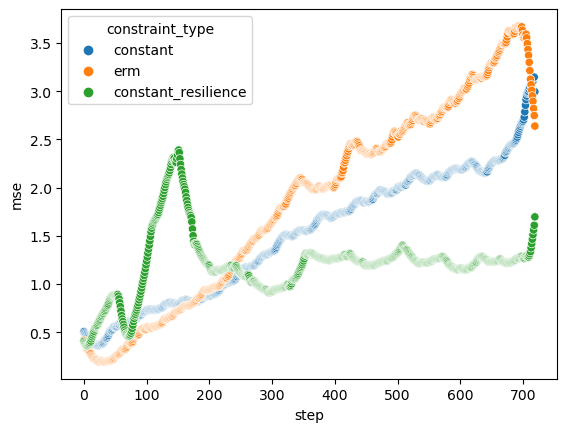

In [ ]:
# filter df_to_plot and summary_metrics to only include autoformer exchange 96 test
summary_debug = summary_metrics.query('model=="Autoformer" and data_path=="exchange_rate.csv" and pred_len==720 and split=="test"').copy()
df_debug = df_to_plot.query('model=="Autoformer" and data_path=="exchange_rate.csv" and pred_len==720 and split=="test"').copy()

display(summary_debug)
display(df_debug.shape)
sns.scatterplot(df_debug,x='step',y='mse',hue='constraint_type')

In [ ]:
df_debug.groupby(['split'])['mse'].mean()

split
test    1.522253
Name: mse, dtype: float64